## Постановка задачи

**Задача**

Требуется, на основании имеющихся данных о клиентах банка, построить модель, используя обучающий датасет, для прогнозирования невыполнения долговых обязательств по текущему кредиту. Выполнить прогноз для примеров из тестового датасета.

**Наименование файлов с данными**

course_project_train.csv - обучающий датасет<br>
course_project_test.csv - тестовый датасет

**Целевая переменная**

Credit Default - факт невыполнения кредитных обязательств

**Метрика качества**

F1-score (sklearn.metrics.f1_score)

**Требования к решению**

*Целевая метрика*
* F1 > 0.5
* Метрика оценивается по качеству прогноза для главного класса (1 - просрочка по кредиту)

*Решение должно содержать*
1. Тетрадка Jupyter Notebook с кодом Вашего решения, названная по образцу {ФИО}\_solution.ipynb, пример SShirkin\_solution.ipynb
2. Файл CSV с прогнозами целевой переменной для тестового датасета, названный по образцу {ФИО}\_predictions.csv, пример SShirkin\_predictions.csv

*Рекомендации для файла с кодом (ipynb)*
1. Файл должен содержать заголовки и комментарии (markdown)
2. Повторяющиеся операции лучше оформлять в виде функций
3. Не делать вывод большого количества строк таблиц (5-10 достаточно)
4. По возможности добавлять графики, описывающие данные (около 3-5)
5. Добавлять только лучшую модель, то есть не включать в код все варианты решения проекта
6. Скрипт проекта должен отрабатывать от начала и до конца (от загрузки данных до выгрузки предсказаний)
7. Весь проект должен быть в одном скрипте (файл ipynb).
8. Допускается применение библиотек Python и моделей машинного обучения,
которые были в данном курсе.

**Сроки сдачи**

Cдать проект нужно в течение 5 дней после окончания последнего вебинара.
Оценки работ, сданных до дедлайна, будут представлены в виде рейтинга, ранжированного по заданной метрике качества.
Проекты, сданные после дедлайна или сданные повторно, не попадают в рейтинг, но можно будет узнать результат.

## Примерное описание этапов выполнения курсового проекта

**Построение модели классификации**
1. Обзор обучающего датасета
2. Обработка выбросов
3. Обработка пропусков
4. Анализ данных
5. Отбор признаков
6. Балансировка классов
7. Подбор моделей, получение бейзлана
8. Выбор наилучшей модели, настройка гиперпараметров
9. Проверка качества, борьба с переобучением
10. Интерпретация результатов

**Прогнозирование на тестовом датасете**
1. Выполнить для тестового датасета те же этапы обработки и постронияния признаков
2. Спрогнозировать целевую переменную, используя модель, построенную на обучающем датасете
3. Прогнозы должны быть для всех примеров из тестового датасета (для всех строк)
4. Соблюдать исходный порядок примеров из тестового датасета

## Подключение библиотек и скриптов

In [1]:
# Импорт необходимых библиотек
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns

# Импорт модулей для сериализации и случайных чисел
import pickle
import random
import subprocess

# Импорт классов и функций для предобработки данных и оценки моделей
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split, ShuffleSplit, cross_val_score, learning_curve
from sklearn.model_selection import KFold, GridSearchCV, RandomizedSearchCV
from sklearn.metrics import classification_report, f1_score, precision_score, recall_score

# Импорт моделей для классификации
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
import xgboost as xgb
import lightgbm as lgbm
import catboost as catb

# Игнорирование предупреждений
import warnings
warnings.filterwarnings('ignore', category=FutureWarning)

# Конфигурация формата графиков
%config InlineBackend.figure_format = 'svg'


## Пути к директориям и файлам

In [2]:
# Тренировочный датасет
# Ввод данных
DATASET_PATH = './data/course_project_train.csv'

# Вывод данных
PREP_DATASET_PATH = './prepared_data/course_project_train_prep.csv'

# Пути для дополнительных файлов
TRAIN_FULL_PATH = './prepared_data/training_project_train_full.csv' # путь к полному тренировочному датасету.
TRAIN_PART_PATH = './prepared_data/training_project_train_part_b.csv'# путь к части тренировочного датасета (часть B).
TEST_PART_PATH = './prepared_data/training_project_test_part.csv'# путь к тестовой части тренировочного датасета.


# Тестовый датасет
# Ввод данных
TEST_DATASET_PATH = './data/course_project_test.csv'

# Вывод данных
PREPARED_TEST_DATASET_PATH = './prepared_data/course_project_test_prepared.csv'
PREDICTED_TEST_DATASET_PATH = './prepared_data/y_test_predicted.csv'

# Пути для файлов сохранения модели и преобразователя данных:
SCALER_FILE_PATH = './scaler/scaler.pkl' # Путь для сохранения файла преобразователя данных (scaler).
MODEL_PATH = './model/model.pkl' # Путь для сохранения файла модели (model).


## Загрузка данных

In [3]:
# Чтение данных из файла CSV
df = pd.read_csv(DATASET_PATH)

# Вывод первых нескольких строк данных
df.head()

,Home Ownership,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,Purpose,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Credit Default
0,Own Home,482087.0,NaN,0.0,11.0,26.3,685960.0,1.0,NaN,1.0,debt consolidation,Short Term,99999999.0,47386.0,7914.0,749.0,0
1,Own Home,1025487.0,10+ years,0.0,15.0,15.3,1181730.0,0.0,NaN,0.0,debt consolidation,Long Term,264968.0,394972.0,18373.0,737.0,1
2,Home Mortgage,751412.0,8 years,0.0,11.0,35.0,1182434.0,0.0,NaN,0.0,debt consolidation,Short Term,99999999.0,308389.0,13651.0,742.0,0
3,Own Home,805068.0,6 years,0.0,8.0,22.5,147400.0,1.0,NaN,1.0,debt consolidation,Short Term,121396.0,95855.0,11338.0,694.0,0
4,Rent,776264.0,8 years,0.0,13.0,13.6,385836.0,1.0,NaN,0.0,debt consolidation,Short Term,125840.0,93309.0,7180.0,719.0,0


In [4]:
# Получение списка названий столбцов
columns = df.columns

# Вывод списка названий столбцов
print(columns)

Index(['Home Ownership', 'Annual Income', 'Years in current job', 'Tax Liens',
       'Number of Open Accounts', 'Years of Credit History',
       'Maximum Open Credit', 'Number of Credit Problems',
       'Months since last delinquent', 'Bankruptcies', 'Purpose', 'Term',
       'Current Loan Amount', 'Current Credit Balance', 'Monthly Debt',
       'Credit Score', 'Credit Default'],
      dtype='object')


## Описание датасета

Описание каждого признака:

1. **Home Ownership** (Тип жилья): Показывает тип собственности на жилье, например, "Владение", "Аренда" или "Ипотека".

2. **Annual Income** (Годовой доход): Отражает годовой доход заемщика в денежном выражении.

3. **Years in current job** (Количество лет на текущей работе): Показывает количество лет, которое заемщик проработал на текущем месте работы.

4. **Tax Liens** (Налоговые обременения): Отражает наличие налоговых обременений или задолженностей у заемщика.

5. **Number of Open Accounts** (Количество открытых счетов): Указывает на общее количество открытых счетов у заемщика, включая кредитные карты, кредитные линии и другие.

6. **Years of Credit History** (Количество лет кредитной истории): Показывает общую продолжительность кредитной истории заемщика в годах.

7. **Maximum Open Credit** (Максимальная открытая кредитная линия): Отражает максимальную сумму кредитной линии, которая была предоставлена заемщику.

8. **Number of Credit Problems** (Количество кредитных проблем): Указывает на количество проблем с кредитом, например, просроченных платежей или коллекций.

9. **Months since last delinquent** (Количество месяцев с последней просрочки платежа): Показывает количество месяцев, прошедших с последней просрочки платежа заемщика.

10. **Bankruptcies** (Банкротства): Отражает количество банкротств, которые заемщик может иметь в кредитной истории.

11. **Purpose** (Цель кредита): Указывает на цель, для которой заемщик берет кредит, например, "автомобиль", "образование" или "недвижимость".

12. **Term** (Срок кредита): Показывает срок кредита в месяцах, например, "краткосрочный" или "долгосрочный".

13. **Current Loan Amount** (Текущая сумма кредита): Отражает текущую сумму, которую заемщик еще должен выплатить по кредиту.

14. **Current Credit Balance** (Текущий кредитный баланс): Указывает на текущий остаток задолженности по кредитам и кредитным линиям.

15. **Monthly Debt** (Ежемесячный долг): Показывает сумму ежемесячных платежей по всем задолженностям и кредитам.

16. **Credit Score** (Кредитный рейтинг): Отражает кредитный рейтинг заемщика, который оценивает его платежеспособность и кредитный риск.

17. **Credit Default** (Кредитный дефолт): Целевая переменная, которая указывает, возникнет ли у заемщика дефолт по кредиту (1 - дефолт, 0 - нет).

In [5]:
# Получение размеров DataFrame
shape = df.shape

# Вывод размеров
print(shape)

(7500, 17)


In [6]:
# Вывод информации о DataFrame
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7500 entries, 0 to 7499
Data columns (total 17 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Home Ownership                7500 non-null   object 
 1   Annual Income                 5943 non-null   float64
 2   Years in current job          7129 non-null   object 
 3   Tax Liens                     7500 non-null   float64
 4   Number of Open Accounts       7500 non-null   float64
 5   Years of Credit History       7500 non-null   float64
 6   Maximum Open Credit           7500 non-null   float64
 7   Number of Credit Problems     7500 non-null   float64
 8   Months since last delinquent  3419 non-null   float64
 9   Bankruptcies                  7486 non-null   float64
 10  Purpose                       7500 non-null   object 
 11  Term                          7500 non-null   object 
 12  Current Loan Amount           7500 non-null   float64
 13  Cur

**На основании предоставленного вывода, можно сделать следующие выводы о наборе данных:**

1. Всего в наборе данных имеется 7500 записей (строк).
2. Всего 17 признаков (столбцов) в данных.
3. Некоторые признаки имеют пропущенные значения (Non-Null Count меньше общего числа записей), включая 'Annual Income', 'Years in current job', 'Months since last delinquent', 'Bankruptcies' и 'Credit Score'. Необходимо обратить внимание на обработку и заполнение пропущенных значений при дальнейшем анализе данных.
4. Большинство признаков представлены числовыми значениями типа float64, включая 'Annual Income', 'Tax Liens', 'Number of Open Accounts', 'Years of Credit History', 'Maximum Open Credit', 'Number of Credit Problems', 'Months since last delinquent', 'Bankruptcies', 'Current Loan Amount', 'Current Credit Balance', 'Monthly Debt' и 'Credit Score'.
5. Некоторые признаки представлены категориальными значениями типа object, включая 'Home Ownership', 'Years in current job', 'Purpose' и 'Term'. При анализе этих признаков может потребоваться преобразование категориальных значений в числовые или использование методов кодирования.
6. Целевой признак 'Credit Default' представлен целочисленными значениями типа int64, где 1 указывает на наличие дефолта по кредиту, а 0 - на его отсутствие.
7. Общий объем памяти, занимаемый данными, составляет около 996.2 KB.

In [7]:
# Получение типов данных столбцов
dtypes = df.dtypes

# Вывод типов данных
print(dtypes)

Home Ownership                   object
Annual Income                   float64
Years in current job             object
Tax Liens                       float64
Number of Open Accounts         float64
Years of Credit History         float64
Maximum Open Credit             float64
Number of Credit Problems       float64
Months since last delinquent    float64
Bankruptcies                    float64
Purpose                          object
Term                             object
Current Loan Amount             float64
Current Credit Balance          float64
Monthly Debt                    float64
Credit Score                    float64
Credit Default                    int64
dtype: object


## Приведение типов

In [8]:
# Цикл для приведения выбранных столбцов к типу str
for column in ['Home Ownership', 'Years in current job', 'Purpose', 'Term']:
    df[column] = df[column].astype(str)


In [9]:
# Получение типов данных столбцов
dtypes = df.dtypes

# Вывод типов данных
print(dtypes)

Home Ownership                   object
Annual Income                   float64
Years in current job             object
Tax Liens                       float64
Number of Open Accounts         float64
Years of Credit History         float64
Maximum Open Credit             float64
Number of Credit Problems       float64
Months since last delinquent    float64
Bankruptcies                    float64
Purpose                          object
Term                             object
Current Loan Amount             float64
Current Credit Balance          float64
Monthly Debt                    float64
Credit Score                    float64
Credit Default                    int64
dtype: object


## Приведение в нижнему регистру, удаление пробелов 

In [10]:
# Изменение названий столбцов на нижний регистр
df = df.rename(columns=lambda x: x.lower())

# Замена пробелов в названиях столбцов на подчеркивания
df.columns = df.columns.str.replace(' ', '_')


In [11]:
# Вывод первых нескольких строк данных
df.head()

,home_ownership,annual_income,years_in_current_job,tax_liens,number_of_open_accounts,years_of_credit_history,maximum_open_credit,number_of_credit_problems,months_since_last_delinquent,bankruptcies,purpose,term,current_loan_amount,current_credit_balance,monthly_debt,credit_score,credit_default
0,Own Home,482087.0,nan,0.0,11.0,26.3,685960.0,1.0,NaN,1.0,debt consolidation,Short Term,99999999.0,47386.0,7914.0,749.0,0
1,Own Home,1025487.0,10+ years,0.0,15.0,15.3,1181730.0,0.0,NaN,0.0,debt consolidation,Long Term,264968.0,394972.0,18373.0,737.0,1
2,Home Mortgage,751412.0,8 years,0.0,11.0,35.0,1182434.0,0.0,NaN,0.0,debt consolidation,Short Term,99999999.0,308389.0,13651.0,742.0,0
3,Own Home,805068.0,6 years,0.0,8.0,22.5,147400.0,1.0,NaN,1.0,debt consolidation,Short Term,121396.0,95855.0,11338.0,694.0,0
4,Rent,776264.0,8 years,0.0,13.0,13.6,385836.0,1.0,NaN,0.0,debt consolidation,Short Term,125840.0,93309.0,7180.0,719.0,0


## Обзор данных

#### Обзор целевой переменной

In [12]:
# Подсчет количества уникальных значений в столбце 'credit_default'
value_counts = df['credit_default'].value_counts()

In [13]:
# Вывод основных статистических характеристик
df.describe()

,annual_income,tax_liens,number_of_open_accounts,years_of_credit_history,maximum_open_credit,number_of_credit_problems,months_since_last_delinquent,bankruptcies,current_loan_amount,current_credit_balance,monthly_debt,credit_score,credit_default
count,5.943000e+03,7500.000000,7500.000000,7500.000000,7.500000e+03,7500.000000,3419.000000,7486.000000,7.500000e+03,7.500000e+03,7500.000000,5943.000000,7500.000000
mean,1.366392e+06,0.030133,11.130933,18.317467,9.451537e+05,0.170000,34.692600,0.117152,1.187318e+07,2.898332e+05,18314.454133,1151.087498,0.281733
std,8.453392e+05,0.271604,4.908924,7.041946,1.602622e+07,0.498598,21.688806,0.347192,3.192612e+07,3.178714e+05,11926.764673,1604.451418,0.449874
min,1.645970e+05,0.000000,2.000000,4.000000,0.000000e+00,0.000000,0.000000,0.000000,1.124200e+04,0.000000e+00,0.000000,585.000000,0.000000
25%,8.443410e+05,0.000000,8.000000,13.500000,2.792295e+05,0.000000,16.000000,0.000000,1.801690e+05,1.142565e+05,10067.500000,711.000000,0.000000
50%,1.168386e+06,0.000000,10.000000,17.000000,4.781590e+05,0.000000,32.000000,0.000000,3.095730e+05,2.093230e+05,16076.500000,731.000000,0.000000
75%,1.640137e+06,0.000000,14.000000,21.800000,7.935015e+05,0.000000,50.000000,0.000000,5.198820e+05,3.604062e+05,23818.000000,743.000000,1.000000
max,1.014934e+07,7.000000,43.000000,57.700000,1.304726e+09,7.000000,118.000000,4.000000,1.000000e+08,6.506797e+06,136679.000000,7510.000000,1.000000


Исходя из предоставленной таблицы со статистической информацией о каждом числовом признаке, можно сделать следующие выводы:

1. Annual Income (Годовой доход):
   - Средний годовой доход составляет примерно 1 366 392.
   - Стандартное отклонение достаточно большое, составляет примерно 845 339. Это указывает на значительное разнообразие в значениях годового дохода.
   - Минимальное значение годового дохода составляет примерно 164 597, а максимальное - около 10 149 340.

2. Tax Liens (Налоговые обременения):
   - Среднее значение налоговых обременений составляет примерно 0,03.
   - Большинство заемщиков (75%) не имеют налоговых обременений, так как 75-й процентиль равен 0.

3. Number of Open Accounts (Количество открытых счетов):
   - Среднее значение количества открытых счетов составляет примерно 11,13.
   - Минимальное количество открытых счетов - 2, а максимальное - 43.

4. Years of Credit History (Стаж кредитной истории):
   - Средний стаж кредитной истории составляет около 18,32 лет.
   - Минимальный стаж кредитной истории - 4 года, а максимальный - 57,7 лет.

5. Maximum Open Credit (Максимальный открытый кредит):
   - Среднее значение максимального открытого кредита составляет около 945 154.
   - Минимальное значение - 0, что может указывать на отсутствие открытых кредитов у некоторых заемщиков.
   - Максимальное значение максимального открытого кредита очень высокое - около 1 304 726 000.

6. Number of Credit Problems (Количество проблем с кредитом):
   - Среднее значение количества проблем с кредитом равно примерно 0,17.
   - Большинство заемщиков (75%) не имеют проблем с кредитом, так как 75-й процентиль равен 0.

7. Months since last delinquent (Количество месяцев с последней просрочки платежа):
   - Количество записей с заполненными значениями данного признака составляет 3419.
   - Среднее значение составляет примерно 34,69 месяцев.
   - Минимальное значение - 0 месяцев, а максимальное - 118 месяцев.

8. Bankruptcies (Количество банкротств):
   - Количество записей с заполненными значениями данного признака составляет 7486.
   - Среднее количество банкротств составляет около 0,12.
   - Большинство заемщиков (75%) не имеют банкротств, так как 75-й процентиль равен 0.

9. Current Loan Amount (Текущая сумма кредита):
   - Средняя текущая сумма кредита составляет около 11 873 180.
   - Минимальная текущая сумма кредита - 11 242, а максимальная - 100 000 000.

10. Current Credit Balance (Текущий кредитный баланс):
    - Средний текущий кредитный баланс составляет около 289 833.
    - Минимальный текущий кредитный баланс - 0, а максимальный - 6 506 797.

11. Monthly Debt (Ежемесячный долг):
    - Средний ежемесячный долг составляет около 18 314.
    - Минимальный ежемесячный долг - 0, а максимальный - 136 679.

12. Credit Score (Кредитный рейтинг):
    - Количество записей с заполненными значениями данного признака составляет 5943.
    - Средний кредитный рейтинг составляет около 1151.
    - Минимальный кредитный рейтинг - 585, а максимальный - 7510.

13. Credit Default (Кредитный дефолт):
    - Количество записей с кредитным дефолтом равно 7500.
    - Значение 0 означает, что заемщик не имеет кредитного дефолта, а значение 1 указывает на наличие дефолта.


**Потенциальные выбросы:**


1. Annual Income (Годовой доход):
   - Максимальное значение годового дохода составляет около 10 149 340. Если большинство значений находится в намного меньшем диапазоне, то это максимальное значение может быть выбросом.

2. Maximum Open Credit (Максимальный открытый кредит):
   - Максимальное значение максимального открытого кредита составляет около 1 304 726 000. Если большинство значений находится в намного меньшем диапазоне, то это максимальное значение может быть выбросом.

3. Current Loan Amount (Текущая сумма кредита):
   - Максимальная текущая сумма кредита составляет 100 000 000, что может быть выбросом, если остальные значения гораздо меньше.

4. Credit Score (Кредитный рейтинг):
   - Максимальное значение кредитного рейтинга составляет 7510. Если большинство значений находится в другом диапазоне, то это максимальное значение может быть выбросом.


## Обработка выбросов

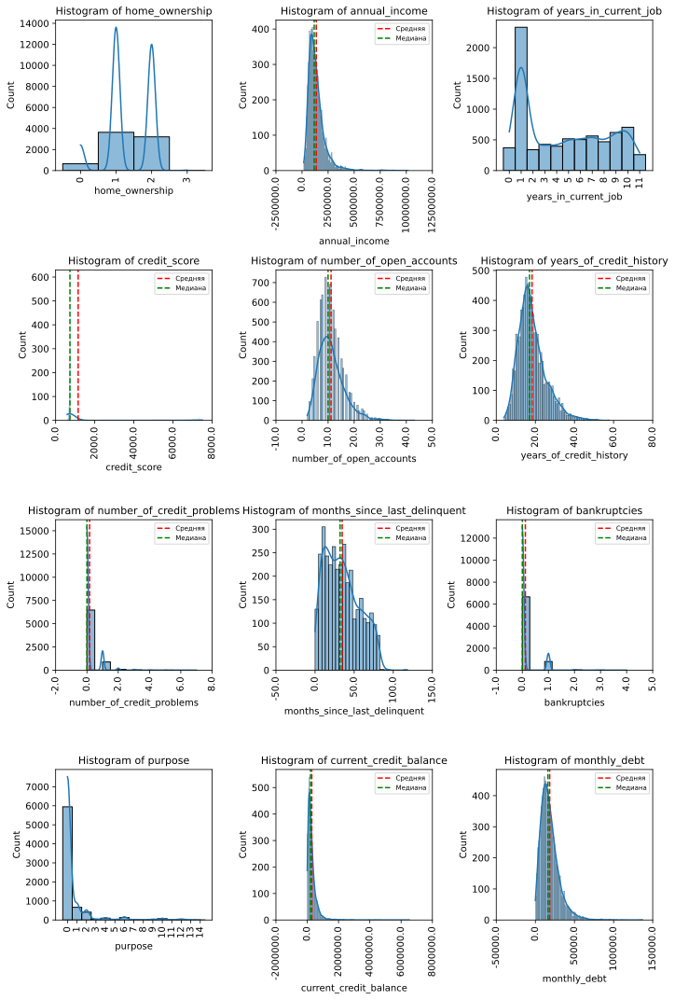

In [14]:

# Генерируем гистограммы для каждого континента
fig, axes = plt.subplots(4, 3, figsize=(10, 15))

# Получение списка всех признаков, кроме целевого признака (если есть)
features = ['home_ownership', 'annual_income', 'years_in_current_job', 'credit_score', 'number_of_open_accounts',
            'years_of_credit_history', 'number_of_credit_problems','months_since_last_delinquent', 'bankruptcies',
            'purpose', 'current_credit_balance', 'monthly_debt']

# Построение гистограммы для каждого признака
for i, feature in enumerate(features):
    ax = axes[i // 3, i % 3]
    chart = sns.histplot(data=df, x=feature, kde=True, ax=ax)
    ax.set_title(f'Histogram of {feature}', fontsize=11)
    ax.set_xticks(ax.get_xticks())
    ax.set_xticklabels(ax.get_xticks(), rotation=90, fontsize=10)
    
    if df[feature].dtype == 'float64':
        # Добавляем вертикальную линию на гистограмму
        mean = df[feature].mean()
        median = df[feature].median()
        ax.axvline(mean, color='red', linestyle='--', label='Средняя')
        ax.axvline(median, color='green', linestyle='--', label='Медиана')
        ax.legend(fontsize=7)

plt.tight_layout()
plt.show()




### Обработка выбросов в признаке `'credit_score'`

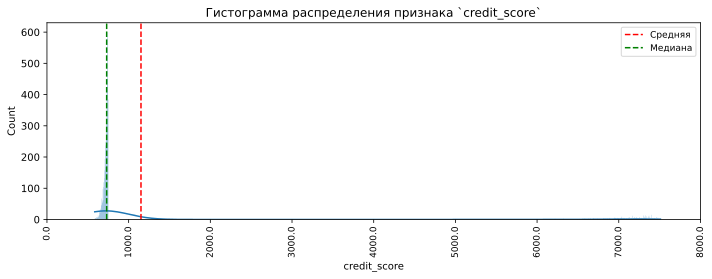

In [15]:
# Создание фигуры и осей для графика
fig, ax = plt.subplots(figsize=(10, 4))

# Построение гистограммы
chart = sns.histplot(data=df, x='credit_score', kde=True, ax=ax)

# Определение среднего и медианы
mean = df['credit_score'].mean()
median = df['credit_score'].median()

# Вертикальные линии для среднего и медианы
ax.axvline(mean, color='red', linestyle='--', label='Средняя')
ax.axvline(median, color='green', linestyle='--', label='Медиана')

# Легенда
ax.legend(fontsize=9)

# Заголовок графика
ax.set_title('Гистограмма распределения признака `credit_score`', fontsize=12)

# Настройка меток на оси X
ax.set_xticks(ax.get_xticks())
ax.set_xticklabels(ax.get_xticks(), rotation=90, fontsize=9)

# Установка компактного расположения графика
plt.tight_layout()

# Вывод графика
plt.show()


In [16]:
# Описание статистических показателей столбца 'credit_score'
df['credit_score'].describe()

count    5943.000000
mean     1151.087498
std      1604.451418
min       585.000000
25%       711.000000
50%       731.000000
75%       743.000000
max      7510.000000
Name: credit_score, dtype: float64

In [17]:
# Определение условий для фильтрации выбросов в столбце 'credit_score'
condition = df['credit_score'] > df['credit_score'].quantile(0.9326)
condition_min = df['credit_score'] < df['credit_score'].quantile(0.015)

# Создание нового столбца 'credit_score_outlier' и установка исходных значений
df['credit_score_outlier'] = 0

# Установка значения 1 для выбросов в столбце 'credit_score_outlier'
df.loc[condition, 'credit_score_outlier'] = 1
df.loc[condition_min, 'credit_score_outlier'] = 1

# Уменьшение значений выбросов в столбце 'credit_score' путем деления на 10
df.loc[condition, 'credit_score'] = df.loc[condition, 'credit_score'] / 10

# Замена значений выбросов в столбце 'credit_score' на медианное значение
df.loc[condition_min, 'credit_score'] = df['credit_score'].median()

In [18]:
# Вывод первых нескольких строк данных
df.head()

,home_ownership,annual_income,years_in_current_job,tax_liens,number_of_open_accounts,years_of_credit_history,maximum_open_credit,number_of_credit_problems,months_since_last_delinquent,bankruptcies,purpose,term,current_loan_amount,current_credit_balance,monthly_debt,credit_score,credit_default,credit_score_outlier
0,Own Home,482087.0,nan,0.0,11.0,26.3,685960.0,1.0,NaN,1.0,debt consolidation,Short Term,99999999.0,47386.0,7914.0,749.0,0,0
1,Own Home,1025487.0,10+ years,0.0,15.0,15.3,1181730.0,0.0,NaN,0.0,debt consolidation,Long Term,264968.0,394972.0,18373.0,737.0,1,0
2,Home Mortgage,751412.0,8 years,0.0,11.0,35.0,1182434.0,0.0,NaN,0.0,debt consolidation,Short Term,99999999.0,308389.0,13651.0,742.0,0,0
3,Own Home,805068.0,6 years,0.0,8.0,22.5,147400.0,1.0,NaN,1.0,debt consolidation,Short Term,121396.0,95855.0,11338.0,694.0,0,0
4,Rent,776264.0,8 years,0.0,13.0,13.6,385836.0,1.0,NaN,0.0,debt consolidation,Short Term,125840.0,93309.0,7180.0,719.0,0,0


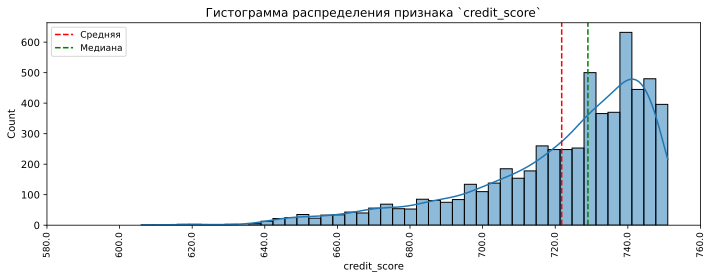

In [19]:
# Создание фигуры и осей для графика
fig, ax = plt.subplots(figsize=(10, 4))

# Построение гистограммы
chart = sns.histplot(data=df, x='credit_score', kde=True, ax=ax)

# Определение среднего и медианы
mean = df['credit_score'].mean()
median = df['credit_score'].median()

# Вертикальные линии для среднего и медианы
ax.axvline(mean, color='red', linestyle='--', label='Средняя')
ax.axvline(median, color='green', linestyle='--', label='Медиана')

# Легенда
ax.legend(fontsize=9)

# Заголовок графика
ax.set_title('Гистограмма распределения признака `credit_score`', fontsize=12)

# Настройка меток на оси X
ax.set_xticks(ax.get_xticks())
ax.set_xticklabels(ax.get_xticks(), rotation=90, fontsize=9)

# Установка компактного расположения графика
plt.tight_layout()

# Вывод графика
plt.show()

### Обработка выбросов в признаке `'annual_income'`

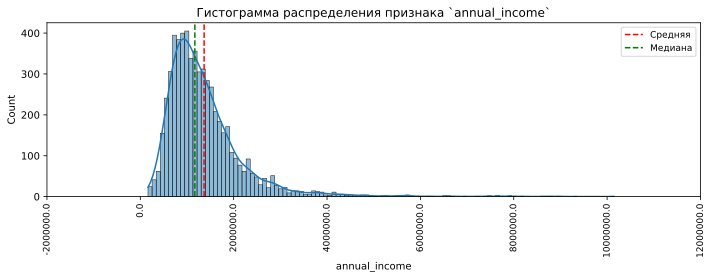

In [20]:
# Создание фигуры и осей для графика
fig, ax = plt.subplots(figsize=(10, 4))

# Построение гистограммы
chart = sns.histplot(data=df, x='annual_income', kde=True, ax=ax)

# Определение среднего и медианы
mean = df['annual_income'].mean()
median = df['annual_income'].median()

# Вертикальные линии для среднего и медианы
ax.axvline(mean, color='red', linestyle='--', label='Средняя')
ax.axvline(median, color='green', linestyle='--', label='Медиана')

# Легенда
ax.legend(fontsize=9)

# Заголовок графика
ax.set_title('Гистограмма распределения признака `annual_income`', fontsize=12)

# Настройка меток на оси X
ax.set_xticks(ax.get_xticks())
ax.set_xticklabels(ax.get_xticks(), rotation=90, fontsize=9)

# Установка компактного расположения графика
plt.tight_layout()

# Вывод графика
plt.show()


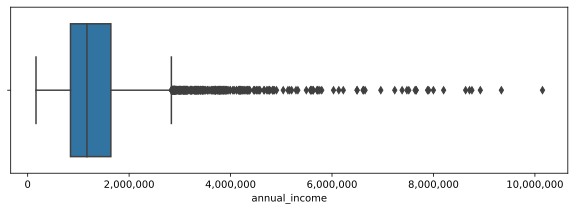

In [21]:
# Создание фигуры с определенным размером
plt.figure(figsize=(10, 3))

# Построение ящика с усами (boxplot)
ax = sns.boxplot(x=df['annual_income'])

# Форматирование оси X для отображения значений с разделителями тысяч
ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))

# Задание подписи для оси X
plt.xlabel('annual_income')

# Вывод графика
plt.show()


In [22]:
def outliers(df, column, quantile):
    """
    Функция для обработки выбросов в столбце DataFrame.

    Аргументы:
    - df: DataFrame - исходный DataFrame
    - column: str - название столбца, в котором требуется обработать выбросы
    - quantile: float - значение квантиля, выше которого считается выброс

    Возвращает:
    - df: DataFrame - обновленный DataFrame с обработанными выбросами
    """

    # Определение условия для фильтрации выбросов
    condition = df[column] > df[column].quantile(quantile)

    # Создание нового столбца для отметки выбросов
    df[column+'_outlier'] = 0

    # Установка значения 1 для выбросов
    df.loc[condition, column+'_outlier'] = 1

    # Замена значений выбросов на медианное значение
    df.loc[condition, column] = df[column].median()

    # Возврат обновленного DataFrame
    return df


In [23]:
# Описание статистических показателей столбца 'annual_income'
df['annual_income'].describe()

count    5.943000e+03
mean     1.366392e+06
std      8.453392e+05
min      1.645970e+05
25%      8.443410e+05
50%      1.168386e+06
75%      1.640137e+06
max      1.014934e+07
Name: annual_income, dtype: float64

In [24]:
# Вызов функции outliers к признаку 'annual_income'
outliers(df, 'annual_income', 0.985)

,home_ownership,annual_income,years_in_current_job,tax_liens,number_of_open_accounts,years_of_credit_history,maximum_open_credit,number_of_credit_problems,months_since_last_delinquent,bankruptcies,purpose,term,current_loan_amount,current_credit_balance,monthly_debt,credit_score,credit_default,credit_score_outlier,annual_income_outlier
0,Own Home,482087.0,nan,0.0,11.0,26.3,685960.0,1.0,NaN,1.0,debt consolidation,Short Term,99999999.0,47386.0,7914.0,749.0,0,0,0
1,Own Home,1025487.0,10+ years,0.0,15.0,15.3,1181730.0,0.0,NaN,0.0,debt consolidation,Long Term,264968.0,394972.0,18373.0,737.0,1,0,0
2,Home Mortgage,751412.0,8 years,0.0,11.0,35.0,1182434.0,0.0,NaN,0.0,debt consolidation,Short Term,99999999.0,308389.0,13651.0,742.0,0,0,0
3,Own Home,805068.0,6 years,0.0,8.0,22.5,147400.0,1.0,NaN,1.0,debt consolidation,Short Term,121396.0,95855.0,11338.0,694.0,0,0,0
4,Rent,776264.0,8 years,0.0,13.0,13.6,385836.0,1.0,NaN,0.0,debt consolidation,Short Term,125840.0,93309.0,7180.0,719.0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7495,Rent,402192.0,< 1 year,0.0,3.0,8.5,107866.0,0.0,NaN,0.0,other,Short Term,129360.0,73492.0,1900.0,697.0,0,0,0
7496,Home Mortgage,1533984.0,1 year,0.0,10.0,26.5,686312.0,0.0,43.0,0.0,debt consolidation,Long Term,444048.0,456399.0,12783.0,741.0,1,1,0
7497,Rent,1878910.0,6 years,0.0,12.0,32.1,1778920.0,0.0,NaN,0.0,buy a car,Short Term,99999999.0,477812.0,12479.0,748.0,0,0,0
7498,Home Mortgage,NaN,nan,0.0,21.0,26.5,1141250.0,0.0,NaN,0.0,debt consolidation,Short Term,615274.0,476064.0,37118.0,NaN,0,0,0


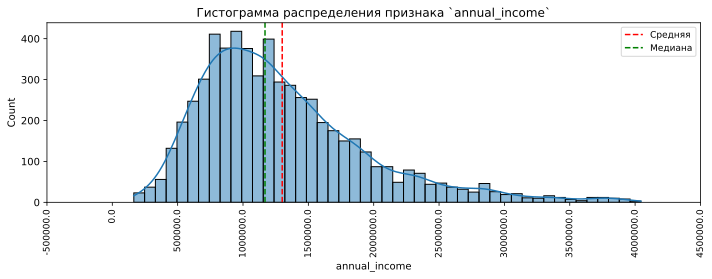

In [25]:
# Создание фигуры и осей для графика
fig, ax = plt.subplots(figsize=(10, 4))

# Построение гистограммы
chart = sns.histplot(data=df, x='annual_income', kde=True, ax=ax)

# Определение среднего и медианы
mean = df['annual_income'].mean()
median = df['annual_income'].median()

# Вертикальные линии для среднего и медианы
ax.axvline(mean, color='red', linestyle='--', label='Средняя')
ax.axvline(median, color='green', linestyle='--', label='Медиана')

# Легенда
ax.legend(fontsize=9)

# Заголовок графика
ax.set_title('Гистограмма распределения признака `annual_income`', fontsize=12)

# Настройка меток на оси X
ax.set_xticks(ax.get_xticks())
ax.set_xticklabels(ax.get_xticks(), rotation=90, fontsize=9)

# Установка компактного расположения графика
plt.tight_layout()

# Вывод графика
plt.show()


### Обработка выбросов в признаке `'current_loan_amount'`

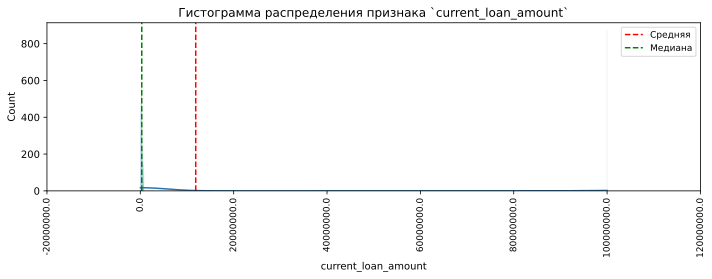

In [26]:
# Создание фигуры и осей для графика
fig, ax = plt.subplots(figsize=(10, 4))

# Построение гистограммы
chart = sns.histplot(data=df, x='current_loan_amount', kde=True, ax=ax)

# Определение среднего и медианы
mean = df['current_loan_amount'].mean()
median = df['current_loan_amount'].median()

# Вертикальные линии для среднего и медианы
ax.axvline(mean, color='red', linestyle='--', label='Средняя')
ax.axvline(median, color='green', linestyle='--', label='Медиана')

# Легенда
ax.legend(fontsize=9)

# Заголовок графика
ax.set_title('Гистограмма распределения признака `current_loan_amount`', fontsize=12)

# Настройка меток на оси X
ax.set_xticks(ax.get_xticks())
ax.set_xticklabels(ax.get_xticks(), rotation=90, fontsize=9)

# Установка компактного расположения графика
plt.tight_layout()

# Вывод графика
plt.show()


In [27]:
def outliers(df, column, quantile):
    """
    Функция для обработки выбросов в столбце DataFrame.

    Аргументы:
    - df: DataFrame - исходный DataFrame
    - column: str - название столбца, в котором требуется обработать выбросы
    - quantile: float - значение квантиля, выше которого считается выброс

    Возвращает:
    - df: DataFrame - обновленный DataFrame с обработанными выбросами
    """

    # Определение условия для фильтрации выбросов
    condition = df[column] > df[column].quantile(quantile)

    # Создание нового столбца для отметки выбросов
    df[column+'_outlier'] = 0

    # Установка значения 1 для выбросов
    df.loc[condition, column+'_outlier'] = 1

    # Замена значений выбросов на медианное значение
    df.loc[condition, column] = df[column].median()

    # Возврат обновленного DataFrame
    return df


In [28]:
# Описание статистических показателей столбца 'maximum_open_credit'
df['current_loan_amount'].describe()

count    7.500000e+03
mean     1.187318e+07
std      3.192612e+07
min      1.124200e+04
25%      1.801690e+05
50%      3.095730e+05
75%      5.198820e+05
max      1.000000e+08
Name: current_loan_amount, dtype: float64

In [29]:
# Вызов функции outliers к признаку 'current_loan_amount'
outliers(df, 'current_loan_amount', 0.884)

,home_ownership,annual_income,years_in_current_job,tax_liens,number_of_open_accounts,years_of_credit_history,maximum_open_credit,number_of_credit_problems,months_since_last_delinquent,bankruptcies,purpose,term,current_loan_amount,current_credit_balance,monthly_debt,credit_score,credit_default,credit_score_outlier,annual_income_outlier,current_loan_amount_outlier
0,Own Home,482087.0,nan,0.0,11.0,26.3,685960.0,1.0,NaN,1.0,debt consolidation,Short Term,309573.0,47386.0,7914.0,749.0,0,0,0,1
1,Own Home,1025487.0,10+ years,0.0,15.0,15.3,1181730.0,0.0,NaN,0.0,debt consolidation,Long Term,264968.0,394972.0,18373.0,737.0,1,0,0,0
2,Home Mortgage,751412.0,8 years,0.0,11.0,35.0,1182434.0,0.0,NaN,0.0,debt consolidation,Short Term,309573.0,308389.0,13651.0,742.0,0,0,0,1
3,Own Home,805068.0,6 years,0.0,8.0,22.5,147400.0,1.0,NaN,1.0,debt consolidation,Short Term,121396.0,95855.0,11338.0,694.0,0,0,0,0
4,Rent,776264.0,8 years,0.0,13.0,13.6,385836.0,1.0,NaN,0.0,debt consolidation,Short Term,125840.0,93309.0,7180.0,719.0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7495,Rent,402192.0,< 1 year,0.0,3.0,8.5,107866.0,0.0,NaN,0.0,other,Short Term,129360.0,73492.0,1900.0,697.0,0,0,0,0
7496,Home Mortgage,1533984.0,1 year,0.0,10.0,26.5,686312.0,0.0,43.0,0.0,debt consolidation,Long Term,444048.0,456399.0,12783.0,741.0,1,1,0,0
7497,Rent,1878910.0,6 years,0.0,12.0,32.1,1778920.0,0.0,NaN,0.0,buy a car,Short Term,309573.0,477812.0,12479.0,748.0,0,0,0,1
7498,Home Mortgage,NaN,nan,0.0,21.0,26.5,1141250.0,0.0,NaN,0.0,debt consolidation,Short Term,615274.0,476064.0,37118.0,NaN,0,0,0,0


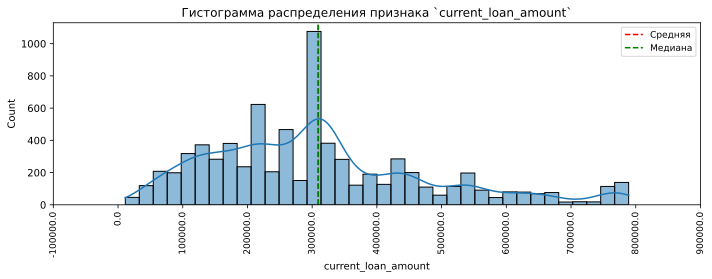

In [30]:
# Создание фигуры и осей для графика
fig, ax = plt.subplots(figsize=(10, 4))

# Построение гистограммы
chart = sns.histplot(data=df, x='current_loan_amount', kde=True, ax=ax)

# Определение среднего и медианы
mean = df['current_loan_amount'].mean()
median = df['current_loan_amount'].median()

# Вертикальные линии для среднего и медианы
ax.axvline(mean, color='red', linestyle='--', label='Средняя')
ax.axvline(median, color='green', linestyle='--', label='Медиана')

# Легенда
ax.legend(fontsize=9)

# Заголовок графика
ax.set_title('Гистограмма распределения признака `current_loan_amount`', fontsize=12)

# Настройка меток на оси X
ax.set_xticks(ax.get_xticks())
ax.set_xticklabels(ax.get_xticks(), rotation=90, fontsize=9)

# Установка компактного расположения графика
plt.tight_layout()

# Вывод графика
plt.show()


### Обработка выбросов в признаке `'maximum_open_credit'`

In [31]:
# Создание фигуры и осей для графика
fig, ax = plt.subplots(figsize=(10, 4))

# Построение гистограммы
chart = sns.histplot(data=df, x='maximum_open_credit', kde=True, ax=ax)

# Определение среднего и медианы
mean = df['maximum_open_credit'].mean()
median = df['maximum_open_credit'].median()

# Вертикальные линии для среднего и медианы
ax.axvline(mean, color='red', linestyle='--', label='Средняя')
ax.axvline(median, color='green', linestyle='--', label='Медиана')

# Легенда
ax.legend(fontsize=9)

# Заголовок графика
ax.set_title('Гистограмма распределения признака `maximum_open_credit`', fontsize=12)

# Настройка меток на оси X
ax.set_xticks(ax.get_xticks())
ax.set_xticklabels(ax.get_xticks(), rotation=90, fontsize=9)

# Установка компактного расположения графика
plt.tight_layout()

# Вывод графика
plt.show()


In [32]:
# Описание статистических показателей столбца 'maximum_open_credit'
df['maximum_open_credit'].describe()

count    7.500000e+03
mean     9.451537e+05
std      1.602622e+07
min      0.000000e+00
25%      2.792295e+05
50%      4.781590e+05
75%      7.935015e+05
max      1.304726e+09
Name: maximum_open_credit, dtype: float64

In [33]:
# Вызов функции outliers к признаку 'maximum_open_credit'
outliers(df, 'maximum_open_credit', 0.975)

,home_ownership,annual_income,years_in_current_job,tax_liens,number_of_open_accounts,years_of_credit_history,maximum_open_credit,number_of_credit_problems,months_since_last_delinquent,bankruptcies,...,term,current_loan_amount,current_credit_balance,monthly_debt,credit_score,credit_default,credit_score_outlier,annual_income_outlier,current_loan_amount_outlier,maximum_open_credit_outlier
0,Own Home,482087.0,nan,0.0,11.0,26.3,685960.0,1.0,NaN,1.0,...,Short Term,309573.0,47386.0,7914.0,749.0,0,0,0,1,0
1,Own Home,1025487.0,10+ years,0.0,15.0,15.3,1181730.0,0.0,NaN,0.0,...,Long Term,264968.0,394972.0,18373.0,737.0,1,0,0,0,0
2,Home Mortgage,751412.0,8 years,0.0,11.0,35.0,1182434.0,0.0,NaN,0.0,...,Short Term,309573.0,308389.0,13651.0,742.0,0,0,0,1,0
3,Own Home,805068.0,6 years,0.0,8.0,22.5,147400.0,1.0,NaN,1.0,...,Short Term,121396.0,95855.0,11338.0,694.0,0,0,0,0,0
4,Rent,776264.0,8 years,0.0,13.0,13.6,385836.0,1.0,NaN,0.0,...,Short Term,125840.0,93309.0,7180.0,719.0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7495,Rent,402192.0,< 1 year,0.0,3.0,8.5,107866.0,0.0,NaN,0.0,...,Short Term,129360.0,73492.0,1900.0,697.0,0,0,0,0,0
7496,Home Mortgage,1533984.0,1 year,0.0,10.0,26.5,686312.0,0.0,43.0,0.0,...,Long Term,444048.0,456399.0,12783.0,741.0,1,1,0,0,0
7497,Rent,1878910.0,6 years,0.0,12.0,32.1,1778920.0,0.0,NaN,0.0,...,Short Term,309573.0,477812.0,12479.0,748.0,0,0,0,1,0
7498,Home Mortgage,NaN,nan,0.0,21.0,26.5,1141250.0,0.0,NaN,0.0,...,Short Term,615274.0,476064.0,37118.0,NaN,0,0,0,0,0


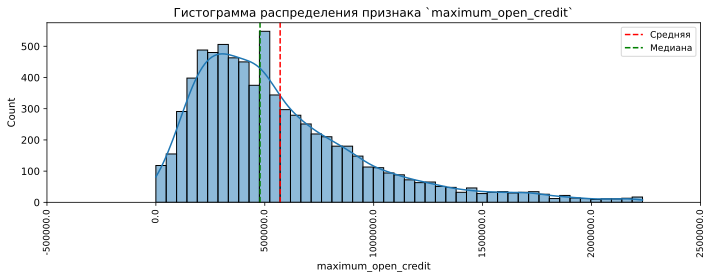

In [34]:
# Создание фигуры и осей для графика
fig, ax = plt.subplots(figsize=(10, 4))

# Построение гистограммы
chart = sns.histplot(data=df, x='maximum_open_credit', kde=True, ax=ax)

# Определение среднего и медианы
mean = df['maximum_open_credit'].mean()
median = df['maximum_open_credit'].median()

# Вертикальные линии для среднего и медианы
ax.axvline(mean, color='red', linestyle='--', label='Средняя')
ax.axvline(median, color='green', linestyle='--', label='Медиана')

# Легенда
ax.legend(fontsize=9)

# Заголовок графика
ax.set_title('Гистограмма распределения признака `maximum_open_credit`', fontsize=12)

# Настройка меток на оси X
ax.set_xticks(ax.get_xticks())
ax.set_xticklabels(ax.get_xticks(), rotation=90, fontsize=9)

# Установка компактного расположения графика
plt.tight_layout()

# Вывод графика
plt.show()


### Обработка выбросов в признаке `'current_credit_balance'`

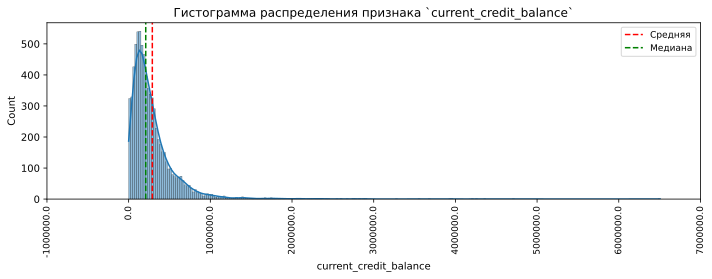

In [35]:
# Создание фигуры и осей для графика
fig, ax = plt.subplots(figsize=(10, 4))

# Построение гистограммы
chart = sns.histplot(data=df, x='current_credit_balance', kde=True, ax=ax)

# Определение среднего и медианы
mean = df['current_credit_balance'].mean()
median = df['current_credit_balance'].median()

# Вертикальные линии для среднего и медианы
ax.axvline(mean, color='red', linestyle='--', label='Средняя')
ax.axvline(median, color='green', linestyle='--', label='Медиана')

# Легенда
ax.legend(fontsize=9)

# Заголовок графика
ax.set_title('Гистограмма распределения признака `current_credit_balance`', fontsize=12)

# Настройка меток на оси X
ax.set_xticks(ax.get_xticks())
ax.set_xticklabels(ax.get_xticks(), rotation=90, fontsize=9)

# Установка компактного расположения графика
plt.tight_layout()

# Вывод графика
plt.show()


In [36]:
# Описание статистических показателей столбца 'current_credit_balance'
df['current_credit_balance'].describe()

count    7.500000e+03
mean     2.898332e+05
std      3.178714e+05
min      0.000000e+00
25%      1.142565e+05
50%      2.093230e+05
75%      3.604062e+05
max      6.506797e+06
Name: current_credit_balance, dtype: float64

In [37]:
# Вызов функции outliers к признаку 'current_credit_balance'
outliers(df, 'current_credit_balance', 0.97)

,home_ownership,annual_income,years_in_current_job,tax_liens,number_of_open_accounts,years_of_credit_history,maximum_open_credit,number_of_credit_problems,months_since_last_delinquent,bankruptcies,...,current_loan_amount,current_credit_balance,monthly_debt,credit_score,credit_default,credit_score_outlier,annual_income_outlier,current_loan_amount_outlier,maximum_open_credit_outlier,current_credit_balance_outlier
0,Own Home,482087.0,nan,0.0,11.0,26.3,685960.0,1.0,NaN,1.0,...,309573.0,47386.0,7914.0,749.0,0,0,0,1,0,0
1,Own Home,1025487.0,10+ years,0.0,15.0,15.3,1181730.0,0.0,NaN,0.0,...,264968.0,394972.0,18373.0,737.0,1,0,0,0,0,0
2,Home Mortgage,751412.0,8 years,0.0,11.0,35.0,1182434.0,0.0,NaN,0.0,...,309573.0,308389.0,13651.0,742.0,0,0,0,1,0,0
3,Own Home,805068.0,6 years,0.0,8.0,22.5,147400.0,1.0,NaN,1.0,...,121396.0,95855.0,11338.0,694.0,0,0,0,0,0,0
4,Rent,776264.0,8 years,0.0,13.0,13.6,385836.0,1.0,NaN,0.0,...,125840.0,93309.0,7180.0,719.0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7495,Rent,402192.0,< 1 year,0.0,3.0,8.5,107866.0,0.0,NaN,0.0,...,129360.0,73492.0,1900.0,697.0,0,0,0,0,0,0
7496,Home Mortgage,1533984.0,1 year,0.0,10.0,26.5,686312.0,0.0,43.0,0.0,...,444048.0,456399.0,12783.0,741.0,1,1,0,0,0,0
7497,Rent,1878910.0,6 years,0.0,12.0,32.1,1778920.0,0.0,NaN,0.0,...,309573.0,477812.0,12479.0,748.0,0,0,0,1,0,0
7498,Home Mortgage,NaN,nan,0.0,21.0,26.5,1141250.0,0.0,NaN,0.0,...,615274.0,476064.0,37118.0,NaN,0,0,0,0,0,0


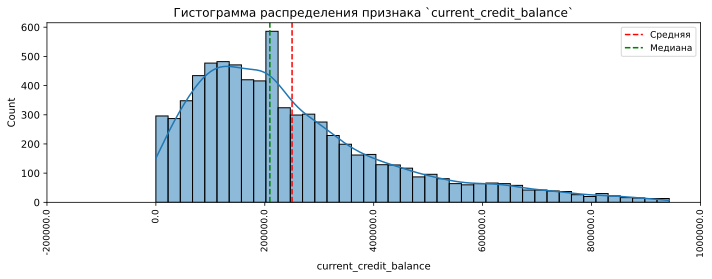

In [38]:
# Создание фигуры и осей для графика
fig, ax = plt.subplots(figsize=(10, 4))

# Построение гистограммы
chart = sns.histplot(data=df, x='current_credit_balance', kde=True, ax=ax)

# Определение среднего и медианы
mean = df['current_credit_balance'].mean()
median = df['current_credit_balance'].median()

# Вертикальные линии для среднего и медианы
ax.axvline(mean, color='red', linestyle='--', label='Средняя')
ax.axvline(median, color='green', linestyle='--', label='Медиана')

# Легенда
ax.legend(fontsize=9)

# Заголовок графика
ax.set_title('Гистограмма распределения признака `current_credit_balance`', fontsize=12)

# Настройка меток на оси X
ax.set_xticks(ax.get_xticks())
ax.set_xticklabels(ax.get_xticks(), rotation=90, fontsize=9)

# Установка компактного расположения графика
plt.tight_layout()

# Вывод графика
plt.show()


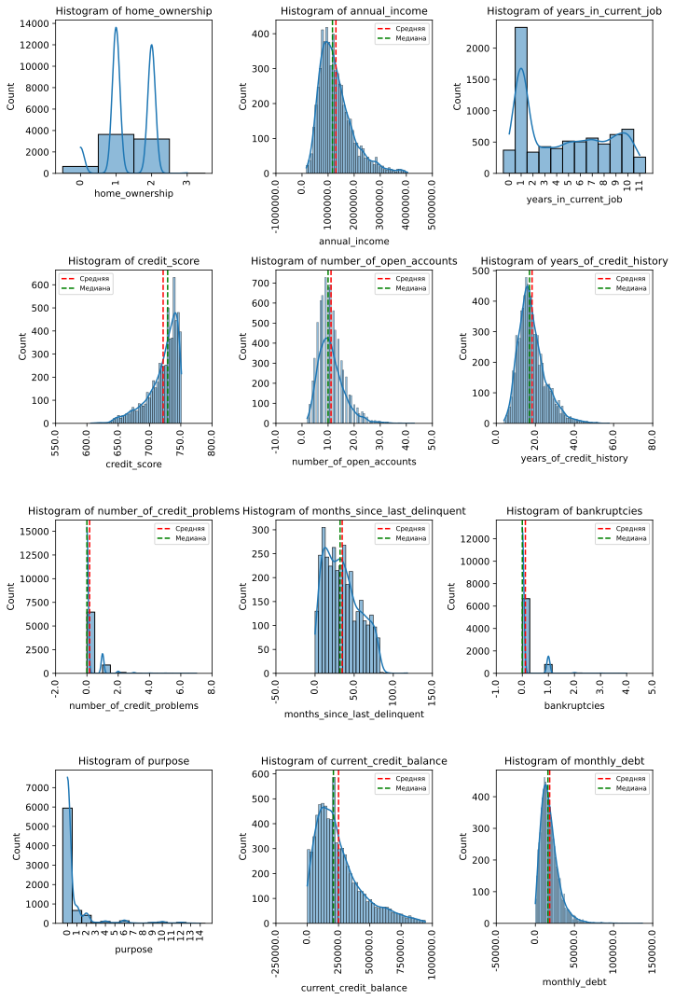

In [39]:
# Создание фигуры и осей для графиков
fig, axes = plt.subplots(4, 3, figsize=(10, 15))

# Получение списка всех признаков, кроме целевого признака (если есть)
features = ['home_ownership', 'annual_income', 'years_in_current_job', 'credit_score', 'number_of_open_accounts',
            'years_of_credit_history', 'number_of_credit_problems','months_since_last_delinquent', 'bankruptcies',
            'purpose', 'current_credit_balance', 'monthly_debt']

# Построение гистограммы для каждого признака
for i, feature in enumerate(features):
    # Получение осей для текущего признака
    ax = axes[i // 3, i % 3]
    
    # Построение гистограммы
    chart = sns.histplot(data=df, x=feature, kde=True, ax=ax)
    
    # Заголовок гистограммы
    ax.set_title(f'Histogram of {feature}', fontsize=11)
    
    # Настройка меток на оси X
    ax.set_xticks(ax.get_xticks())
    ax.set_xticklabels(ax.get_xticks(), rotation=90, fontsize=10)
    
    # Если тип признака - числовой
    if df[feature].dtype == 'float64':
        # Определение среднего и медианы
        mean_feature = df[feature].mean()
        median_feature = df[feature].median()
        
        # Добавление вертикальных линий для среднего и медианы
        ax.axvline(mean_feature, color='red', linestyle='--', label='Средняя')
        ax.axvline(median_feature, color='green', linestyle='--', label='Медиана')
        ax.legend(fontsize=7)

# Установка компактного расположения графиков
plt.tight_layout()

# Вывод графиков
plt.show()


### Проверка на явные дубликаты в DataFrame

In [40]:
# Подсчет количества дубликатов и уникальных строк
duplicated_counts = df.duplicated().value_counts()

# Вывод результатов
print(duplicated_counts)


False    7500
dtype: int64


### Обзор номинативных признаков

In [41]:
# Вывод информации о категориальных столбцах и их значениях
for cat_colname in df.select_dtypes(include='object').columns:
    print(str(cat_colname) + '\n\n' + str(df[cat_colname].value_counts()) + '\n' + '*' * 100 + '\n')


home_ownership

Home Mortgage    3637
Rent             3204
Own Home          647
Have Mortgage      12
Name: home_ownership, dtype: int64
****************************************************************************************************

years_in_current_job

10+ years    2332
2 years       705
3 years       620
< 1 year      563
5 years       516
1 year        504
4 years       469
6 years       426
7 years       396
nan           371
8 years       339
9 years       259
Name: years_in_current_job, dtype: int64
****************************************************************************************************

purpose

debt consolidation      5944
other                    665
home improvements        412
business loan            129
buy a car                 96
medical bills             71
major purchase            40
take a trip               37
buy house                 34
small business            26
wedding                   15
moving                    11
educational expenses 

## Обработка пропусков

In [42]:
# Смотрим собщее количество пропусков в данных
df.isna().sum()

home_ownership                       0
annual_income                     1557
years_in_current_job                 0
tax_liens                            0
number_of_open_accounts              0
years_of_credit_history              0
maximum_open_credit                  0
number_of_credit_problems            0
months_since_last_delinquent      4081
bankruptcies                        14
purpose                              0
term                                 0
current_loan_amount                  0
current_credit_balance               0
monthly_debt                         0
credit_score                      1557
credit_default                       0
credit_score_outlier                 0
annual_income_outlier                0
current_loan_amount_outlier          0
maximum_open_credit_outlier          0
current_credit_balance_outlier       0
dtype: int64

In [43]:
# Обработка пропущенных значений в DataFrame
for column in df.columns:
    # Замена строковых 'nan' на значения np.nan
    df.loc[df[column] == 'nan', column] = np.nan
    
    # Проверка наличия пропущенных значений
    if df[column].isna().any():
        # Создание нового столбца для отметки пропущенных значений
        df[column+'_na'] = 0
        
        # Установка значения 1 для пропущенных значений
        df.loc[df[column].isna(), column+'_na'] = 1


In [44]:
# Смотрим собщее количество пропусков в данных
df.isna().sum()

home_ownership                        0
annual_income                      1557
years_in_current_job                371
tax_liens                             0
number_of_open_accounts               0
years_of_credit_history               0
maximum_open_credit                   0
number_of_credit_problems             0
months_since_last_delinquent       4081
bankruptcies                         14
purpose                               0
term                                  0
current_loan_amount                   0
current_credit_balance                0
monthly_debt                          0
credit_score                       1557
credit_default                        0
credit_score_outlier                  0
annual_income_outlier                 0
current_loan_amount_outlier           0
maximum_open_credit_outlier           0
current_credit_balance_outlier        0
annual_income_na                      0
years_in_current_job_na               0
months_since_last_delinquent_na       0


In [45]:
# Вычисление процентного соотношения пропущенных значений
na_pers = df.isna().sum() / (df.notna().sum() + df.isna().sum())

# Вывод результатов
for key, value in na_pers.items():
    print(f'{key: <35} {round(value * 100, 2):.2f}%')

home_ownership                      0.00%
annual_income                       20.76%
years_in_current_job                4.95%
tax_liens                           0.00%
number_of_open_accounts             0.00%
years_of_credit_history             0.00%
maximum_open_credit                 0.00%
number_of_credit_problems           0.00%
months_since_last_delinquent        54.41%
bankruptcies                        0.19%
purpose                             0.00%
term                                0.00%
current_loan_amount                 0.00%
current_credit_balance              0.00%
monthly_debt                        0.00%
credit_score                        20.76%
credit_default                      0.00%
credit_score_outlier                0.00%
annual_income_outlier               0.00%
current_loan_amount_outlier         0.00%
maximum_open_credit_outlier         0.00%
current_credit_balance_outlier      0.00%
annual_income_na                    0.00%
years_in_current_job_na        

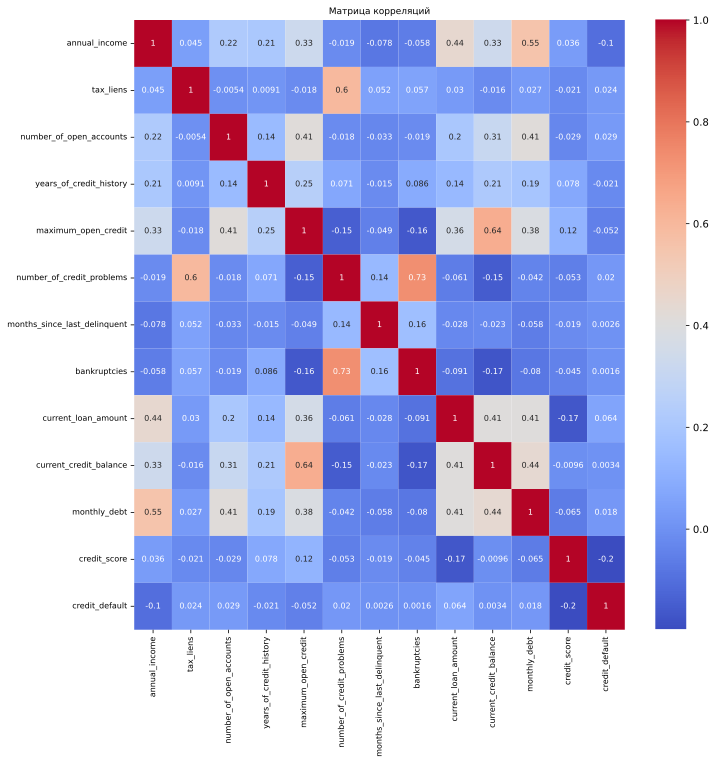

In [46]:
# Вычисление матрицы корреляций
correlation_matrix = df[df.columns[~df.columns.str.contains('outlier') & (~df.columns.str.contains('na'))]].corr()

# Создание графика тепловой карты с матрицей корреляций
plt.figure(figsize=(11, 11))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')

# Уменьшение размера шрифта на осях
plt.xticks(fontsize=8, rotation = 90)
plt.yticks(fontsize=8)

# Уменьшение размера шрифта в аннотациях
ax = plt.gca()
for text in ax.texts:
    text.set_fontsize(8)

plt.title('Матрица корреляций', fontsize=9)
plt.show()

In [47]:
# Заполнение пропущенных значений столбца 'annual_income' с помощью группировки по 'monthly_debt'
df['annual_income'] = df.groupby(['monthly_debt'])['annual_income']\
.transform(lambda x: x.fillna(x.mean()) if x.notna().any() else x)

# Заполнение пропущенных значений столбца 'annual_income' с помощью группировки по 'current_credit_balance'
df['annual_income'] = df.groupby(['current_credit_balance'])['annual_income']\
.transform(lambda x: x.fillna(x.mean()) if x.notna().any() else x)


In [48]:
df.isna().sum()

home_ownership                        0
annual_income                      1020
years_in_current_job                371
tax_liens                             0
number_of_open_accounts               0
years_of_credit_history               0
maximum_open_credit                   0
number_of_credit_problems             0
months_since_last_delinquent       4081
bankruptcies                         14
purpose                               0
term                                  0
current_loan_amount                   0
current_credit_balance                0
monthly_debt                          0
credit_score                       1557
credit_default                        0
credit_score_outlier                  0
annual_income_outlier                 0
current_loan_amount_outlier           0
maximum_open_credit_outlier           0
current_credit_balance_outlier        0
annual_income_na                      0
years_in_current_job_na               0
months_since_last_delinquent_na       0


In [49]:
# Создание интервалов для группировки столбца 'monthly_debt'
bins = np.linspace(0, df['monthly_debt'].max(), 9)

# Определение меток для каждого интервала
labels = [0, 1, 2, 3, 4, 5, 6, 7]

# Создание нового столбца 'monthly_debt_categories' с категориями
df['monthly_debt_categories'] = pd.cut(df['monthly_debt'], bins=bins, labels=labels, include_lowest=True).astype(int)


In [50]:
# Заполнение пропущенных значений столбца 'annual_income' средними значениями в каждой категории 'monthly_debt_categories'
for category in df['monthly_debt_categories'].unique():
    df.loc[(df['monthly_debt_categories'] == category) & (df['annual_income'].isna()), 'annual_income']\
    = df.loc[df['monthly_debt_categories'] == category]['annual_income'].mean()


In [51]:
# Создание нового столбца 'years_working' на основе столбца 'years_in_current_job'
df['years_working'] = df['years_in_current_job'].map({'10+ years': '10', '6 years': '6', '8 years': '8', '4 years': '4',
                                                      '2 years': '2', '3 years': '3', '7 years': '7', '1 year': '1', 
                                                      '< 1 year': '0', '5 years': '5', '9 years': '9'})


In [52]:
# Преобразование столбца 'years_working' к типу float
df['years_working'] = df['years_working'].astype(float)


In [53]:
# Создание интервалов для группировки столбца 'years_of_credit_history'
bins = np.linspace(0, df['years_of_credit_history'].max(), 12)

# Определение меток для каждого интервала
labels = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]

# Создание нового столбца 'years_of_credit_history_categories' с категориями
df['years_of_credit_history_categories'] = pd.cut(df['years_of_credit_history'], bins=bins,
                                                  labels=labels, include_lowest=True).astype(int)


In [54]:
# Заполнение пропущенных значений 'years_working' средними значениями в каждой категории 'years_of_credit_history_categories'
for category in df['years_of_credit_history_categories'].unique():
    mean_value = df.loc[df['years_of_credit_history_categories'] == category]['years_working'].mean()
    df.loc[(df['years_of_credit_history_categories'] == category) & (df['years_working'].isna()), 'years_working']\
    = round(mean_value, 0)

     

In [55]:
# Проверяем на пропуски в значениях признаков
df.isna().sum()

home_ownership                           0
annual_income                            0
years_in_current_job                   371
tax_liens                                0
number_of_open_accounts                  0
years_of_credit_history                  0
maximum_open_credit                      0
number_of_credit_problems                0
months_since_last_delinquent          4081
bankruptcies                            14
purpose                                  0
term                                     0
current_loan_amount                      0
current_credit_balance                   0
monthly_debt                             0
credit_score                          1557
credit_default                           0
credit_score_outlier                     0
annual_income_outlier                    0
current_loan_amount_outlier              0
maximum_open_credit_outlier              0
current_credit_balance_outlier           0
annual_income_na                         0
years_in_cu

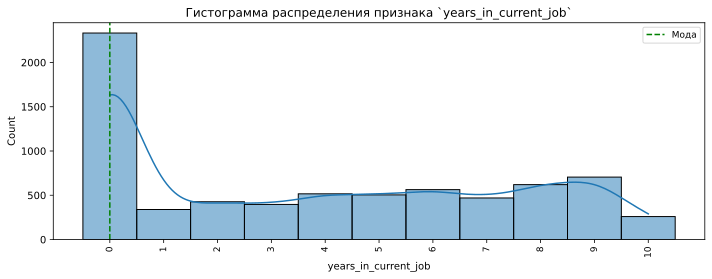

In [56]:
# Создание фигуры и осей для графика
fig, ax = plt.subplots(figsize=(10, 4))

# Построение гистограммы распределения признака 'years_in_current_job'
chart = sns.histplot(data=df, x='years_in_current_job', kde=True, ax=ax)

# Вычисление моды признака 'years_in_current_job'
moda = df['years_in_current_job'].mode()[0]

# Добавление вертикальной линии, обозначающей моду
ax.axvline(moda, color='green', linestyle='--', label='Мода')
ax.legend(fontsize=9)

# Настройка заголовка и осей графика
ax.set_title('Гистограмма распределения признака `years_in_current_job`', fontsize=12)
ax.set_xticks(ax.get_xticks())
ax.set_xticklabels(ax.get_xticks(), rotation=90, fontsize=9)

# Отображение графика
plt.tight_layout()
plt.show()


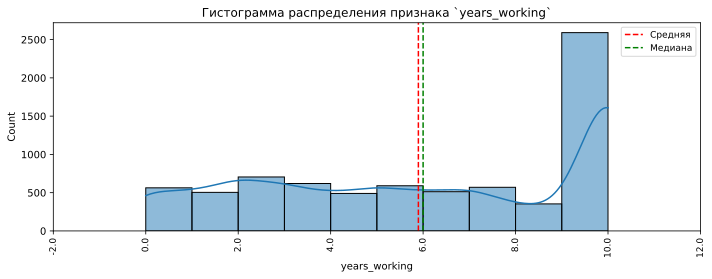

In [57]:
# Создание фигуры и осей для графика
fig, ax = plt.subplots(figsize=(10, 4))

# Построение гистограммы распределения признака 'years_working'
chart = sns.histplot(data=df, x='years_working', kde=True, ax=ax, bins=10)

# Вычисление среднего значения и медианы
mean = df['years_working'].mean()
median = df['years_working'].median()

# Добавление вертикальных линий для среднего значения и медианы
ax.axvline(mean, color='red', linestyle='--', label='Средняя')
ax.axvline(median, color='green', linestyle='--', label='Медиана')
ax.legend(fontsize=9)

# Настройка заголовка и меток оси x
ax.set_title('Гистограмма распределения признака `years_working`', fontsize=12)
ax.set_xticks(ax.get_xticks())
ax.set_xticklabels(ax.get_xticks(), rotation=90, fontsize=9)

# Компактное расположение элементов графика
plt.tight_layout()

# Отображение графика
plt.show()

In [58]:
# Вычисление медианы столбца 'years_working'
median = df['years_working'].median()

# Замена пропущенных значений медианой
df['years_working'] = df['years_working'].fillna(median)


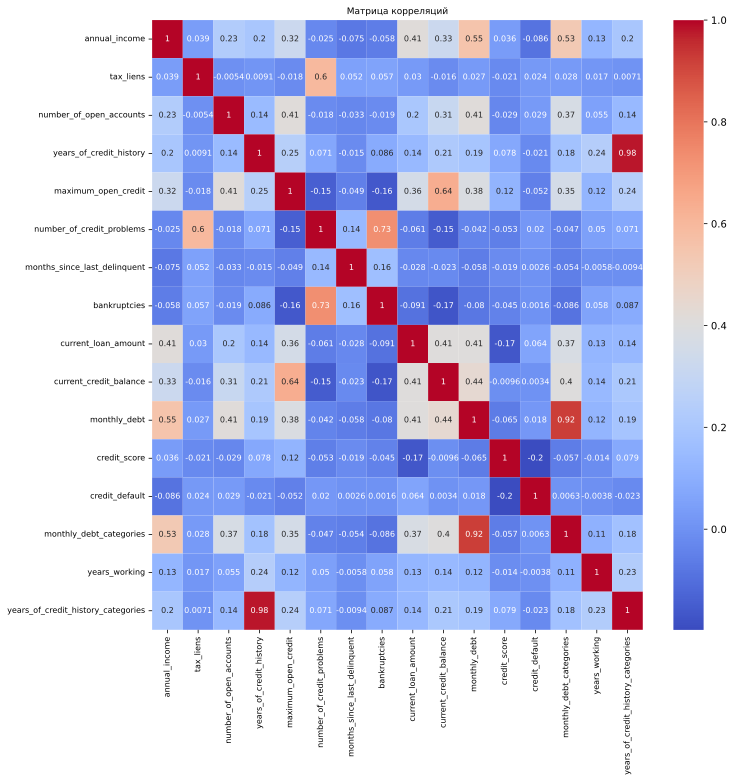

In [59]:
# Вычисление матрицы корреляций
correlation_matrix = df[df.columns[~df.columns.str.contains('outlier') & (~df.columns.str.contains('na'))]].corr()

# Создание графика тепловой карты с матрицей корреляций
plt.figure(figsize=(11, 11))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')

# Уменьшение размера шрифта на осях
plt.xticks(fontsize=8, rotation = 90)
plt.yticks(fontsize=8)

# Уменьшение размера шрифта в аннотациях
ax = plt.gca()
for text in ax.texts:
    text.set_fontsize(8)

plt.title('Матрица корреляций', fontsize=9)
plt.show()

In [60]:
# Удаление столбца 'years_in_current_job' из DataFrame
df.drop(columns='years_in_current_job', inplace=True)

# Переименование столбца 'years_working' в 'years_in_current_job'
df.rename(columns={'years_working': 'years_in_current_job'}, inplace=True)


In [61]:
# Проверяем на пропуски в значениях признаков
df.isna().sum()

home_ownership                           0
annual_income                            0
tax_liens                                0
number_of_open_accounts                  0
years_of_credit_history                  0
maximum_open_credit                      0
number_of_credit_problems                0
months_since_last_delinquent          4081
bankruptcies                            14
purpose                                  0
term                                     0
current_loan_amount                      0
current_credit_balance                   0
monthly_debt                             0
credit_score                          1557
credit_default                           0
credit_score_outlier                     0
annual_income_outlier                    0
current_loan_amount_outlier              0
maximum_open_credit_outlier              0
current_credit_balance_outlier           0
annual_income_na                         0
years_in_current_job_na                  0
months_sinc

#### Заполнение пропущенных значений в столбце 'bankruptcies' с использованием медианы

In [62]:
# Вычисление медианы столбца 'bankruptcies'
median = df['bankruptcies'].median()

# Замена пропущенных значений медианой
df['bankruptcies'] = df['bankruptcies'].fillna(median)


In [63]:
# Найти признаки с наибольшей корреляцией с "credit_score"
correlation = df.corr()['credit_score'].abs().sort_values(ascending=False)
relevant_features = correlation[correlation != 1].index

filling_values = {}

# Заполнить пропущенные значения "credit_score" на основе других признаков
for feature in relevant_features:
    filling_values[feature] = df.groupby(feature)['credit_score'].transform('mean')
    df['credit_score'] = df['credit_score'].fillna(filling_values[feature])


#### Заполнение пропущенных значений в столбце 'months_since_last_delinquent' нулевым значением

In [64]:
# Замена пропущенных значений на 0
df['months_since_last_delinquent'] = df['months_since_last_delinquent'].fillna(0)


In [65]:
# Определение столбцов с дискретными данными
discrete_data_columns = [col for col in df.columns if len(df[col].unique()) < 90 and df[col].dtype != 'object']

# Определение столбцов с непрерывными данными
continuous_data_columns = [col for col in df.columns if len(df[col].unique()) > 89 and df[col].dtype != 'object']

# Преобразование столбцов с дискретными данными в тип int
df[discrete_data_columns] = df[discrete_data_columns].astype(int)

# Преобразование столбцов с непрерывными данными в тип float
df[continuous_data_columns] = df[continuous_data_columns].astype(float)


In [66]:
# Создание дамми-переменных для категориальных столбцов
for cat_colname in df.select_dtypes(include='object').columns:
    df = pd.concat([df, pd.get_dummies(df[cat_colname], prefix=cat_colname)], axis=1)

In [67]:
# Сохранение DataFrame в CSV файл
df.to_csv(PREP_DATASET_PATH, index=False, encoding='utf-8')


### Выделение целевой переменной и групп признаков

In [68]:
# Загрузка исходного DataFrame из CSV файла
df_base = pd.read_csv(DATASET_PATH)

# Загрузка предобработанного DataFrame из CSV файла
df = pd.read_csv(PREP_DATASET_PATH)


In [69]:
# Изменение названий столбцов на нижний регистр
df_base = df_base.rename(columns=lambda x: x.lower())
df = df.rename(columns=lambda x: x.lower())

# Замена пробелов в названиях столбцов на подчеркивания
df_base.columns = df_base.columns.str.replace(' ', '_')
df.columns = df.columns.str.replace(' ', '_')

In [70]:
# Название целевой переменной
TARGET_NAME = 'credit_default'

# Список имен признаков (исключая целевую переменную)
BASE_FEATURE_NAMES = df_base.columns.drop(TARGET_NAME).tolist()

### Анализ целевой переменной

**Обзор распределения**

In [71]:
# Подсчет количества значений в целевой переменной
df[TARGET_NAME].value_counts()


0    5387
1    2113
Name: credit_default, dtype: int64

In [72]:
# Преобразование целевой переменной в тип int
df[TARGET_NAME] = df[TARGET_NAME].astype(int)


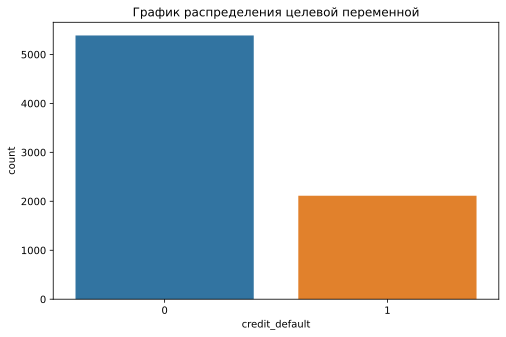

In [73]:
# Создание фигуры и осей для графика
plt.figure(figsize=(8, 5))

# Построение графика распределения целевой переменной
sns.countplot(x=TARGET_NAME, data=df)

# Настройка заголовка графика
plt.title('График распределения целевой переменной')

# Отображение графика
plt.show()

**Корреляция с базовыми признаками**

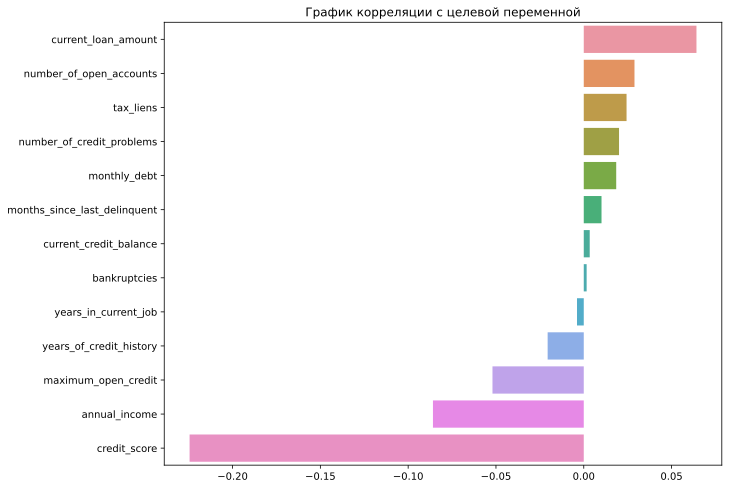

In [74]:
# Вычисление корреляции признаков с целевой переменной
corr_with_target = df[BASE_FEATURE_NAMES + [TARGET_NAME]].corr().iloc[:-1, -1].sort_values(ascending=False)

# Создание фигуры и осей для графика
plt.figure(figsize=(10, 8))

# Построение столбчатой диаграммы корреляции
sns.barplot(x=corr_with_target.values, y=corr_with_target.index)

# Настройка заголовка графика
plt.title('График корреляции с целевой переменной')

# Отображение графика
plt.show()


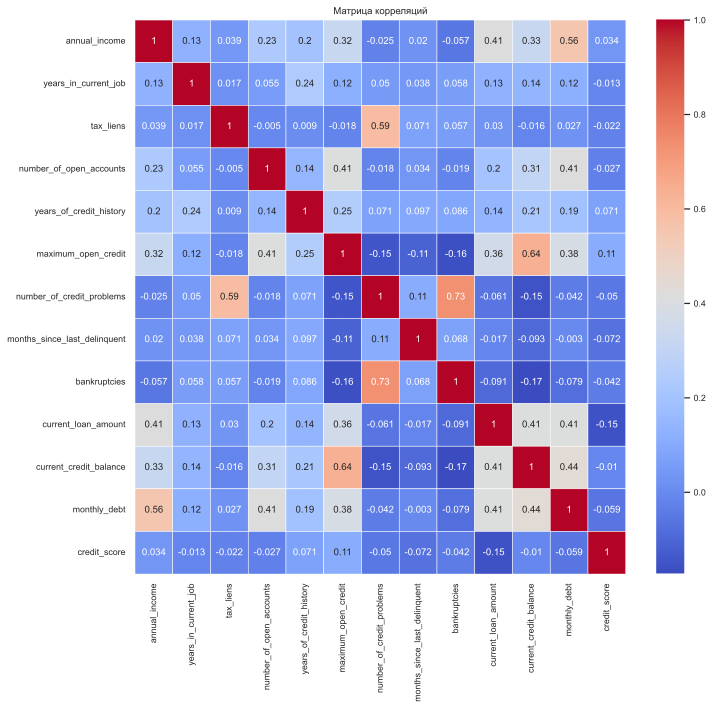

In [75]:
# Создание фигуры и осей для графика
plt.figure(figsize=(11, 10))

# Настройка масштаба шрифта
sns.set(font_scale=0.8)

# Построение тепловой карты матрицы корреляции
sns.heatmap(df[BASE_FEATURE_NAMES].corr().round(3), annot=True, linewidths=.5, cmap='coolwarm')

# Настройка заголовка графика
plt.title('Матрица корреляций')

# Отображение графика
plt.show()


In [76]:
def get_classification_report(y_train_true, y_train_pred, y_test_true, y_test_pred):
    # Вывод отчета о классификации для тренировочного набора данных
    print('TRAIN\n\n' + classification_report(y_train_true, y_train_pred))
    
    # Вывод отчета о классификации для тестового набора данных
    print('TEST\n\n' + classification_report(y_test_true, y_test_pred))
    
    # Вывод матрицы ошибок
    print('CONFUSION MATRIX\n')
    print(pd.crosstab(y_test_true, y_test_pred))


In [77]:
def balance_df_by_target(df, target_name):
    # Подсчет количества значений в целевой переменной
    target_counts = df[target_name].value_counts()

    # Название класса с наибольшим количеством записей
    major_class_name = target_counts.idxmax()

    # Название класса с наименьшим количеством записей
    minor_class_name = target_counts.idxmin()

    # Коэффициент дисбаланса классов
    disbalance_coeff = int(target_counts[major_class_name] / target_counts[minor_class_name]) - 1

    # Создание дополнительных записей для класса с наименьшим количеством записей
    for i in range(disbalance_coeff):
        sample = df[df[target_name] == minor_class_name].sample(target_counts[minor_class_name])
        df = df.append(sample, ignore_index=True)

    # Перемешивание данных в DataFrame
    df = df.sample(frac=1)

    return df


### Отбор признаков

In [78]:
# Определение списка признаков с количеством уникальных значений более 2 и типом данных отличным от 'object'
NUM_FEATURE_NAMES = [col for col in df.columns if len(df[col].unique()) > 2 and df[col].dtype != 'object']

# Определение списка категориальных признаков на основе типа данных 'object'
CAT_FEATURE_NAMES = df.select_dtypes(object).columns.tolist()

# Определение списка бинарных признаков с количеством уникальных значений не более 2, исключая целевую переменную 'credit_default'
BINARY_FEATURE_NAMES = [col for col in df.columns if len(df[col].unique()) <= 2 and df[col].dtype != 'object' \
                        and col != 'credit_default']

# Объединение списков NUM_FEATURE_NAMES и BINARY_FEATURE_NAMES
SELECTED_FEATURE_NAMES = NUM_FEATURE_NAMES + BINARY_FEATURE_NAMES


In [79]:
# Преобразование категориальных признаков в тип данных 'Categorical'
for colname in CAT_FEATURE_NAMES:
    df[colname] = pd.Categorical(df[colname])

# Вывод типов данных категориальных признаков
print(df[CAT_FEATURE_NAMES].dtypes)


home_ownership    category
purpose           category
term              category
dtype: object


### Нормализация данных

In [80]:
# Создание объекта StandardScaler
scaler = StandardScaler()

# Создание копии DataFrame для нормализации
df_norm = df.copy()

# Нормализация числовых признаков с помощью StandardScaler
df_norm[NUM_FEATURE_NAMES] = scaler.fit_transform(df_norm[NUM_FEATURE_NAMES])

# Присвоение нормализованных значений обратно в исходный DataFrame
df = df_norm.copy()

In [81]:
df.shape

(7500, 50)

**Сохранение модели для нормализации данных**

In [82]:
# Сохранение объекта StandardScaler в файл
with open(SCALER_FILE_PATH, 'wb') as file:
    pickle.dump(scaler, file)

### Разбиение на train и test

In [83]:
# Разделение данных на обучающую и тестовую выборки
X = df[SELECTED_FEATURE_NAMES]
y = df[TARGET_NAME]
X_train, X_test, y_train, y_test = train_test_split(X, y, shuffle=True, test_size=0.30, random_state=21)

### Балансировка целевой переменной

In [84]:
# Создание DataFrame для балансировки
df_for_balancing = pd.concat([X_train, y_train], axis=1)
df_balanced = balance_df_by_target(df_for_balancing, TARGET_NAME)

# Вывод количества значений в целевой переменной после балансировки
print(df_balanced[TARGET_NAME].value_counts())


0    3771
1    2958
Name: credit_default, dtype: int64


In [85]:
# Исключение целевой переменной из обучающего набора данных
X_train = df_balanced.drop(columns=TARGET_NAME)

# Определение целевой переменной для обучающего набора данных
y_train = df_balanced[TARGET_NAME]


### Сохранение обучающего и тестового датасетов

In [86]:
# Объединение обучающих данных X_train и y_train в один DataFrame train
train = pd.concat([X_train, y_train], axis=1)

# Объединение тестовых данных X_test и y_test в один DataFrame test
test = pd.concat([X_test, y_test], axis=1)


In [87]:
# Сохранение полного набора данных в файл TRAIN_FULL_PATH
df.to_csv(TRAIN_FULL_PATH, index=False, encoding='utf-8')

# Сохранение обучающего набора данных в файл TRAIN_PART_PATH
train.to_csv(TRAIN_PART_PATH, index=False, encoding='utf-8')

# Сохранение тестового набора данных в файл TEST_PART_PATH
test.to_csv(TEST_PART_PATH, index=False, encoding='utf-8')


### Построение и оценка базовых моделей

**Логистическая регрессия**

In [88]:
# Создание и обучение модели Logistic Regression
model_lr = LogisticRegression(max_iter=1000)
model_lr.fit(X_train, y_train)

# Предсказание целевой переменной на обучающем и тестовом наборе данных
y_train_pred = model_lr.predict(X_train)
y_test_pred = model_lr.predict(X_test)

# Вывод отчета о классификации
get_classification_report(y_train, y_train_pred, y_test, y_test_pred)

TRAIN

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      3771
           1       0.72      0.59      0.65      2958

    accuracy                           0.72      6729
   macro avg       0.72      0.71      0.71      6729
weighted avg       0.72      0.72      0.71      6729

TEST

              precision    recall  f1-score   support

           0       0.83      0.81      0.82      1616
           1       0.54      0.57      0.56       634

    accuracy                           0.74      2250
   macro avg       0.69      0.69      0.69      2250
weighted avg       0.75      0.74      0.75      2250

CONFUSION MATRIX

col_0              0    1
credit_default           
0               1310  306
1                271  363


**k ближайших соседей**

In [89]:
# Создание и обучение модели K-Nearest Neighbors
model_knn = KNeighborsClassifier()
model_knn.fit(X_train, y_train)

# Предсказание целевой переменной на обучающем и тестовом наборе данных
y_train_pred = model_knn.predict(X_train)
y_test_pred = model_knn.predict(X_test)

# Вывод отчета о классификации
get_classification_report(y_train, y_train_pred, y_test, y_test_pred)

TRAIN

              precision    recall  f1-score   support

           0       0.77      0.86      0.81      3771
           1       0.79      0.67      0.73      2958

    accuracy                           0.78      6729
   macro avg       0.78      0.77      0.77      6729
weighted avg       0.78      0.78      0.78      6729

TEST

              precision    recall  f1-score   support

           0       0.78      0.78      0.78      1616
           1       0.44      0.45      0.45       634

    accuracy                           0.68      2250
   macro avg       0.61      0.61      0.61      2250
weighted avg       0.69      0.68      0.69      2250

CONFUSION MATRIX

col_0              0    1
credit_default           
0               1253  363
1                348  286


**Бустинговые алгоритмы**

*XGBoost*

In [90]:
# Создание и обучение модели XGBoost
model_xgb = xgb.XGBClassifier(random_state=21)
model_xgb.fit(X_train, y_train)

# Предсказание целевой переменной на обучающем и тестовом наборе данных
y_train_pred = model_xgb.predict(X_train)
y_test_pred = model_xgb.predict(X_test)

# Вывод отчета о классификации
get_classification_report(y_train, y_train_pred, y_test, y_test_pred)

TRAIN

              precision    recall  f1-score   support

           0       0.99      1.00      1.00      3771
           1       1.00      0.99      0.99      2958

    accuracy                           0.99      6729
   macro avg       1.00      0.99      0.99      6729
weighted avg       0.99      0.99      0.99      6729

TEST

              precision    recall  f1-score   support

           0       0.85      0.89      0.87      1616
           1       0.68      0.59      0.63       634

    accuracy                           0.81      2250
   macro avg       0.76      0.74      0.75      2250
weighted avg       0.80      0.81      0.80      2250

CONFUSION MATRIX

col_0              0    1
credit_default           
0               1441  175
1                263  371


*LightGBM*

In [91]:
# Создание и обучение модели LightGBM
model_lgbm = lgbm.LGBMClassifier(random_state=21)
model_lgbm.fit(X_train, y_train)

# Предсказание целевой переменной на обучающем и тестовом наборе данных
y_train_pred = model_lgbm.predict(X_train)
y_test_pred = model_lgbm.predict(X_test)

# Вывод отчета о классификации
get_classification_report(y_train, y_train_pred, y_test, y_test_pred)

TRAIN

              precision    recall  f1-score   support

           0       0.96      0.99      0.97      3771
           1       0.98      0.94      0.96      2958

    accuracy                           0.97      6729
   macro avg       0.97      0.97      0.97      6729
weighted avg       0.97      0.97      0.97      6729

TEST

              precision    recall  f1-score   support

           0       0.85      0.90      0.87      1616
           1       0.69      0.59      0.63       634

    accuracy                           0.81      2250
   macro avg       0.77      0.74      0.75      2250
weighted avg       0.80      0.81      0.80      2250

CONFUSION MATRIX

col_0              0    1
credit_default           
0               1449  167
1                262  372


*CatBoost*

In [92]:
# Создание и обучение модели CatBoost
model_catb = catb.CatBoostClassifier(silent=True, random_state=21)
model_catb.fit(X_train, y_train)

# Предсказание целевой переменной на обучающем и тестовом наборе данных
y_train_pred = model_catb.predict(X_train)
y_test_pred = model_catb.predict(X_test)

# Вывод отчета о классификации
get_classification_report(y_train, y_train_pred, y_test, y_test_pred)

TRAIN

              precision    recall  f1-score   support

           0       0.94      0.99      0.96      3771
           1       0.98      0.92      0.95      2958

    accuracy                           0.96      6729
   macro avg       0.96      0.95      0.96      6729
weighted avg       0.96      0.96      0.96      6729

TEST

              precision    recall  f1-score   support

           0       0.85      0.91      0.88      1616
           1       0.71      0.58      0.64       634

    accuracy                           0.82      2250
   macro avg       0.78      0.75      0.76      2250
weighted avg       0.81      0.82      0.81      2250

CONFUSION MATRIX

col_0              0    1
credit_default           
0               1468  148
1                264  370


### Выбор лучшей модели и подбор гиперпараметров

In [93]:
%%time

# Создание модели CatBoost с заданными параметрами
model_catb = catb.CatBoostClassifier(class_weights=[1, 3.5], silent=True, random_state=21)

# Задание параметров для поиска по сетке
params = {'n_estimators': [50, 100, 200, 500, 700, 1000, 1200, 1300],
          'max_depth': [3, 5, 7, 9]}

# Создание объекта GridSearchCV с моделью и параметрами
grid_search = GridSearchCV(estimator=model_catb, param_grid=params, cv=KFold(n_splits=3, random_state=21, shuffle=True))

# Поиск наилучших параметров с помощью кросс-валидации
grid_search.fit(X_train, y_train)

# Вывод наилучших параметров и результатов поиска
print("Best Parameters: ", grid_search.best_params_)
print("Best Score: ", grid_search.best_score_)


Best Parameters:  {'max_depth': 9, 'n_estimators': 1300}
Best Score:  0.8093327388913657
CPU times: user 17min 30s, sys: 3min 58s, total: 21min 29s
Wall time: 3h 2min 46s


In [94]:
%%time

# Создание модели CatBoost с заданными параметрами
model_catb = catb.CatBoostClassifier(class_weights=[1, 3.5], silent=True, random_state=21)

# Задание параметров для случайного поиска
params = {'n_estimators':[50, 100, 200, 500, 700, 1000, 1200, 1300],
          'max_depth':[3, 5, 7, 9]}

# Создание объекта KFold для кросс-валидации
cv = KFold(n_splits=3, random_state=21, shuffle=True)

# Создание объекта RandomizedSearchCV с моделью, параметрами, метрикой оценки и разбиением на фолды
rs = RandomizedSearchCV(model_catb, params, scoring='f1', cv=cv, n_jobs=-1)

# Поиск наилучших параметров с помощью случайного поиска
rs.fit(X, y)

# Вывод наилучших параметров и результатов поиска
print("Best Parameters: ", rs.best_params_)
print("Best Score: ", rs.best_score_)


Best Parameters:  {'n_estimators': 1000, 'max_depth': 7}
Best Score:  0.6438525834246117
CPU times: user 14.9 s, sys: 2.66 s, total: 17.6 s
Wall time: 56min 23s


**Обучение и оценка финальной модели**

In [95]:
%%time

# Создание финальной модели CatBoost с оптимальными параметрами
final_model = catb.CatBoostClassifier(n_estimators=1200, max_depth=9, silent=True, random_state=21)

# Обучение финальной модели на полном обучающем наборе данных
final_model.fit(X_train, y_train)

# Предсказание целевой переменной на обучающем и тестовом наборе данных
y_train_pred = final_model.predict(X_train)
y_test_pred = final_model.predict(X_test)

# Вывод отчета о классификации
get_classification_report(y_train, y_train_pred, y_test, y_test_pred)

TRAIN

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3771
           1       1.00      1.00      1.00      2958

    accuracy                           1.00      6729
   macro avg       1.00      1.00      1.00      6729
weighted avg       1.00      1.00      1.00      6729

TEST

              precision    recall  f1-score   support

           0       0.84      0.95      0.89      1616
           1       0.80      0.54      0.65       634

    accuracy                           0.83      2250
   macro avg       0.82      0.74      0.77      2250
weighted avg       0.83      0.83      0.82      2250

CONFUSION MATRIX

col_0              0    1
credit_default           
0               1528   88
1                289  345
CPU times: user 1min 19s, sys: 17.2 s, total: 1min 36s
Wall time: 18.4 s


In [96]:
def show_proba_calibration_plots(y_predicted_probs, y_true_labels):
    # Создание массива с предсказанными вероятностями и истинными метками
    preds_with_true_labels = np.array(list(zip(y_predicted_probs, y_true_labels)))

    # Инициализация списков для хранения метрик и порогов
    thresholds = []
    precisions = []
    recalls = []
    f1_scores = []

    # Вычисление метрик для различных порогов вероятностей
    for threshold in np.linspace(0.1, 0.9, 9):
        thresholds.append(threshold)
        precisions.append(precision_score(y_true_labels, list(map(int, y_predicted_probs > threshold))))
        recalls.append(recall_score(y_true_labels, list(map(int, y_predicted_probs > threshold))))
        f1_scores.append(f1_score(y_true_labels, list(map(int, y_predicted_probs > threshold))))

    # Создание таблицы с результатами метрик
    scores_table = pd.DataFrame({'f1': f1_scores,
                                 'precision': precisions,
                                 'recall': recalls,
                                 'probability': thresholds}).sort_values('f1', ascending=False).round(3)

    # Создание фигуры для отображения графиков
    figure = plt.figure(figsize=(12, 5))
    sns.set(font_scale=1)

    # Построение графика калибровки порогов вероятностей
    plt1 = figure.add_subplot(121)
    plt1.plot(thresholds, precisions, label='Precision', linewidth=4)
    plt1.plot(thresholds, recalls, label='Recall', linewidth=4)
    plt1.plot(thresholds, f1_scores, label='F1', linewidth=4)
    plt1.set_ylabel('Scores')
    plt1.set_xlabel('Probability threshold')
    plt1.set_title('Probabilities threshold calibration')
    plt1.legend(bbox_to_anchor=(0.25, 0.25))
    plt1.table(cellText=scores_table.values,
               colLabels=scores_table.columns,
               colLoc='center', cellLoc='center', loc='bottom', bbox=[0, -1.3, 1, 1])

    # Построение гистограммы вероятностей
    plt2 = figure.add_subplot(122)
    plt2.hist(preds_with_true_labels[preds_with_true_labels[:, 1] == 0][:, 0],
              label='Another class', color='royalblue', alpha=1)
    plt2.hist(preds_with_true_labels[preds_with_true_labels[:, 1] == 1][:, 0],
              label='Main class', color='darkcyan', alpha=0.8)
    plt2.set_ylabel('Number of examples')
    plt2.set_xlabel('Probabilities')
    plt2.set_title('Probability histogram')
    plt2.legend(bbox_to_anchor=(1, 1))

    # Отображение графиков
    plt.show()


In [97]:

def show_learning_curve_plot(estimator, X, y, cv=3, n_jobs=-1, train_sizes=np.linspace(.1, 1.0, 5)):

    # Вычисление кривых обучения
    train_sizes, train_scores, test_scores = learning_curve(estimator, X, y, 
                                                            cv=cv, 
                                                            scoring='f1',
                                                            train_sizes=train_sizes, 
                                                            n_jobs=n_jobs)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)

    # Построение графика кривых обучения
    plt.figure(figsize=(12, 8))
    sns.set(font_scale=1)
    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1, color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    plt.title(f"Learning curves ({type(estimator).__name__})")
    plt.xlabel("Training examples")
    plt.ylabel("Score")     
    plt.legend(loc="best")
    plt.grid()
    plt.show()


In [98]:

def show_feature_importances(feature_names, feature_importances, get_top=None):
    # Создание DataFrame с признаками и их важностью
    feature_importances = pd.DataFrame({'feature': feature_names, 'importance': feature_importances})
    feature_importances = feature_importances.sort_values('importance', ascending=False)
       
    # Построение графика важности признаков
    plt.figure(figsize=(9, len(feature_importances) * 0.355))
    sns.barplot(x=feature_importances['importance'], y=feature_importances['feature'])
    plt.xlabel('Importance')
    plt.title('Importance of features')
    plt.show()
    
    if get_top is not None:
        # Возвращение списка с наиболее важными признаками
        return feature_importances['feature'][:get_top].tolist()


### Снижение степени переобучения

In [99]:
# Создание финальной модели CatBoost с оптимальными параметрами
final_model = catb.CatBoostClassifier(n_estimators=1200, max_depth=9, l2_leaf_reg=70, silent=True, random_state=21)

# Обучение финальной модели на обучающем наборе данных
final_model.fit(X_train, y_train)

# Предсказание целевой переменной на обучающем и тестовом наборе данных
y_train_pred = final_model.predict(X_train)
y_test_pred = final_model.predict(X_test)

# Предсказание вероятностей классов на тестовом наборе данных
y_test_pred_probs = final_model.predict_proba(X_test)

# Вывод отчета о классификации
get_classification_report(y_train, y_train_pred, y_test, y_test_pred)


TRAIN

              precision    recall  f1-score   support

           0       0.96      0.99      0.97      3771
           1       0.98      0.95      0.97      2958

    accuracy                           0.97      6729
   macro avg       0.97      0.97      0.97      6729
weighted avg       0.97      0.97      0.97      6729

TEST

              precision    recall  f1-score   support

           0       0.85      0.92      0.88      1616
           1       0.74      0.59      0.66       634

    accuracy                           0.83      2250
   macro avg       0.80      0.76      0.77      2250
weighted avg       0.82      0.83      0.82      2250

CONFUSION MATRIX

col_0              0    1
credit_default           
0               1487  129
1                260  374


### Подбор оптимального размера выборки, кривая обучения

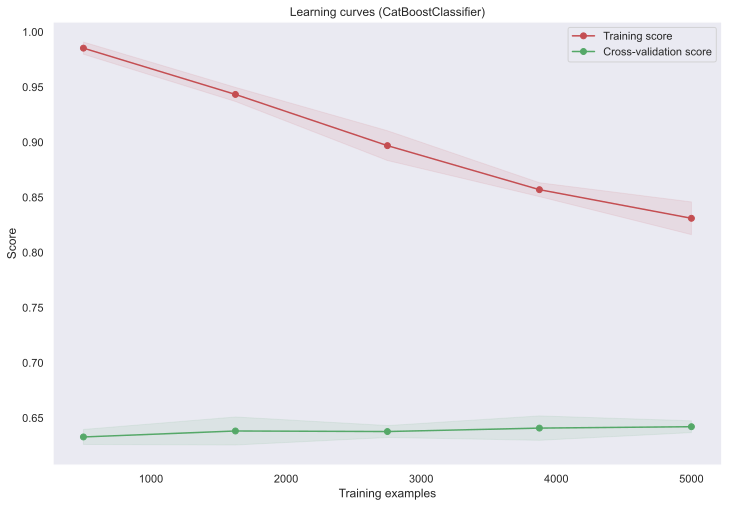

In [100]:
show_learning_curve_plot(final_model, X, y)

### Выбор порога вероятности для определения класса

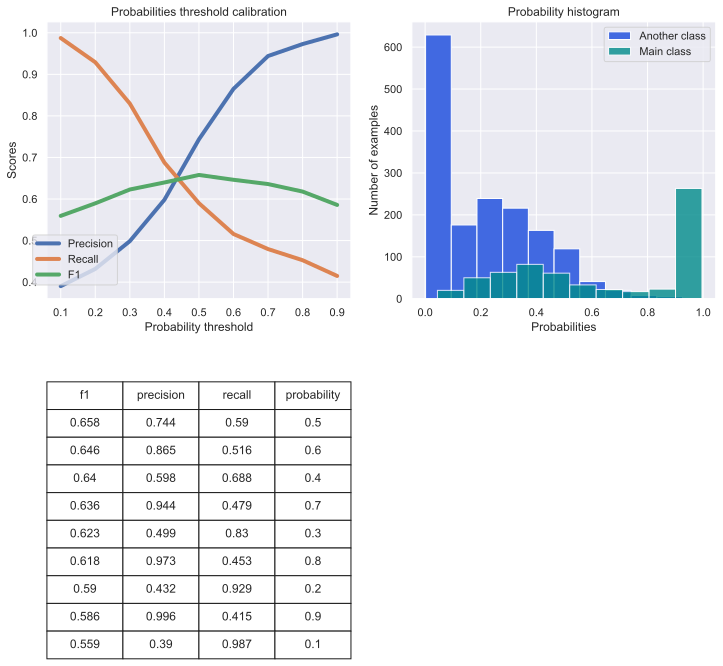

In [101]:
show_proba_calibration_plots(y_test_pred_probs[:, 1], y_test)

### Важность признаков

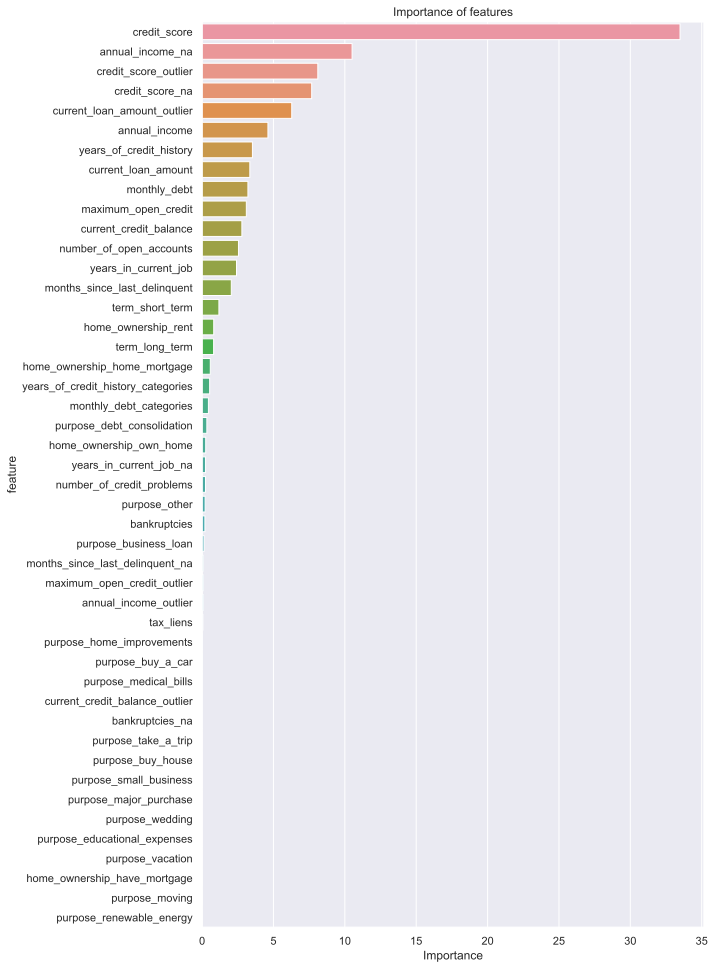

In [102]:
# Вызов функции show_feature_importances для отображения важности признаков
important_features_top = show_feature_importances(X_train.columns, final_model.feature_importances_, get_top=45)


### Финальная модель

In [103]:
# Создание и настройка модели CatBoostClassifier
final_model = catb.CatBoostClassifier(n_estimators=1200, max_depth=9, l2_leaf_reg=70, 
                                      silent=True, random_state=21)

# Обучение модели на обучающем наборе данных
final_model.fit(X_train, y_train)

# Предсказание целевой переменной на обучающем и тестовом наборе данных
y_train_pred = final_model.predict(X_train)
y_test_pred = final_model.predict(X_test)

# Предсказание вероятностей классов на тестовом наборе данных
y_test_pred_probs = final_model.predict_proba(X_test)

# Вывод отчета о классификации
get_classification_report(y_train, y_train_pred, y_test, y_test_pred)


TRAIN

              precision    recall  f1-score   support

           0       0.96      0.99      0.97      3771
           1       0.98      0.95      0.97      2958

    accuracy                           0.97      6729
   macro avg       0.97      0.97      0.97      6729
weighted avg       0.97      0.97      0.97      6729

TEST

              precision    recall  f1-score   support

           0       0.85      0.92      0.88      1616
           1       0.74      0.59      0.66       634

    accuracy                           0.83      2250
   macro avg       0.80      0.76      0.77      2250
weighted avg       0.82      0.83      0.82      2250

CONFUSION MATRIX

col_0              0    1
credit_default           
0               1487  129
1                260  374


### Сохранение финальной модели

In [104]:
# Сохранение обученной модели в файл
with open(MODEL_PATH, 'wb') as file:
    pickle.dump(final_model, file)


## Прогнозирование на тестовом датасете

In [105]:
class DataPipeline:
    """Подготовка исходных данных"""
    
    def __init__(self):
        """Параметры класса"""
        self.credit_score_median = None
        self.bankruptcies = None
        
    def prepare_head(self, df):
        
        # Изменение названий столбцов на нижний регистр
        df = df.rename(columns=lambda x: x.lower())
        # Замена пробелов в названиях столбцов на подчеркивания
        df.columns = df.columns.str.replace(' ', '_')
        
        return df
        
    def fit(self, df):

        """Сохранение статистик"""
        # Расчет квартилей для выбросов
        self.credit_score_max_quantile = df['credit_score'].quantile(0.9326)
        self.credit_score_min_quantile = df['credit_score'].quantile(0.015)
        
        # Расчет медианы для замены пропущенных значений
        self.credit_score_median = df['credit_score'].median()
        self.bankruptcies = df['bankruptcies'].median()
        
    def transform(self, df):
        """Трансформация данных"""
   
        # 1. Выбросы (outliers)
        
        # Обработка выбросов в столбце 'credit_score'
        condition = df['credit_score'] > self.credit_score_max_quantile
        condition_min = df['credit_score'] < self.credit_score_min_quantile
        df['credit_score_outlier'] = 0
        df.loc[condition | condition_min, 'credit_score_outlier'] = 1
        df.loc[condition, 'credit_score'] = df.loc[condition, 'credit_score'] / 10
        df.loc[condition_min, 'credit_score'] = self.credit_score_median
        
        # Обработка выбросов в других столбцах
        def outliers(df, column, quantile):
            condition = df[column] > df[column].quantile(quantile)
            df[column+'_outlier'] = 0
            df.loc[condition, column+'_outlier'] = 1
            df.loc[condition, column] = df[column].median()
            return df
        
        outliers(df, 'annual_income', 0.985)
        outliers(df, 'current_loan_amount', 0.884)
        outliers(df, 'maximum_open_credit', 0.975)
        outliers(df, 'current_credit_balance', 0.97)
        
        # 2. Пропуски
        
        # Обработка пропущенных значений
        for column in df.columns:
            df.loc[df[column] == 'nan', column] = np.nan
            if df[column].isna().any():
                df[column+'_na'] = 0
                df.loc[df[column].isna(), column+'_na'] = 1
        
        # Заполнение пропущенных значений в столбце 'annual_income' на основе других признаков
        df['annual_income'] = df.groupby(['monthly_debt'])['annual_income']\
        .transform(lambda x: x.fillna(x.mean()) if x.notna().any() else x)
        df['annual_income'] = df.groupby(['current_credit_balance'])['annual_income']\
        .transform(lambda x: x.fillna(x.mean()) if x.notna().any() else x)
        
        # 2.1. Новые фичи (features)
        
        # Категоризация столбца 'monthly_debt'
        bins = np.linspace(0, df['monthly_debt'].max(), 9)
        labels = [0, 1, 2, 3, 4, 5, 6, 7]
        df['monthly_debt_categories'] = pd.cut(df['monthly_debt'], bins=bins, labels=labels,\
                                               include_lowest=True).astype(int)
        
        # Заполнение пропущенных значений в столбце 'annual_income' на основе категории 'monthly_debt_categories'
        for category in df['monthly_debt_categories'].unique():
            df.loc[(df['monthly_debt_categories'] == category) & (df['annual_income'].isna()), 'annual_income']\
            = df.loc[df['monthly_debt_categories'] == category]['annual_income'].mean()
            
        # Обработка столбца 'years_in_current_job'
        df['years_working'] = df['years_in_current_job'].map({'10+ years':'10', '6 years':'6', '8 years':'8',
                                                              '4 years':'4', '2 years':'2', '3 years':'3',
                                                              '7 years':'7', '1 year':'1', '< 1 year':'0', 
                                                              '5 years':'5', '9 years':'9'})
        df['years_working'] = df['years_working'].astype(float)
        
        # Категоризация столбца 'years_of_credit_history'
        bins = np.linspace(0, df['years_of_credit_history'].max(), 12)
        labels = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
        df['years_of_credit_history_categories'] = pd.cut(df['years_of_credit_history'], bins=bins, labels=labels,
                                                          include_lowest=True)
        
        # Заполнение пропущенных значений в столбце 'years_working' на основе категории 'years_of_credit_history_categories'
        for category in df['years_of_credit_history_categories'].unique():
            mean_value = df.loc[df['years_of_credit_history_categories'] == category]['years_working'].mean()
            df.loc[(df['years_of_credit_history_categories'] == category) & (df['years_working'].isna()),\
                   'years_working'] = round(mean_value, 0)
        
        # Заполнение пропущенных значений в столбце 'years_working' медианным значением
        df['years_working'] = df['years_working'].fillna(df['years_working'].median())
        df.drop(columns='years_in_current_job', inplace=True)
        df.rename(columns={'years_working': 'years_in_current_job'}, inplace=True)
        
        # Заполнение пропущенных значений в столбце 'bankruptcies' медианным значением
        df['bankruptcies'] = df['bankruptcies'].fillna(self.bankruptcies)
        
        # Найти признаки с наибольшей корреляцией с 'credit_score'
        correlation = df.corr()['credit_score'].abs().sort_values(ascending=False)
        relevant_features = correlation[correlation != 1].index
        
        filling_values = {}
        
        # Заполнение пропущенных значений в столбце 'credit_score' на основе других признаков
        for feature in relevant_features:
            filling_values[feature] = df.groupby(feature)['credit_score'].transform('mean')
            df['credit_score'] = df['credit_score'].fillna(filling_values[feature])
            
        # Заполнение пропущенных значений в столбце 'months_since_last_delinquent' нолями   
        df['months_since_last_delinquent'] = df['months_since_last_delinquent'].fillna(0)
        
        # 3. Обработка типов признаков
        
        # Преобразование признаков с дискретными значениями в int
        discrete_data_columns = [col for col in df.columns if len(df[col].unique()) < 90 and df[col].dtype != 'object']
        df[discrete_data_columns] = df[discrete_data_columns].astype(int)
        
        # Преобразование признаков с непрерывными значениями во float
        continuous_data_columns = [col for col in df.columns if len(df[col].unique()) > 89 and df[col].dtype != 'object']
        df[continuous_data_columns] = df[continuous_data_columns].astype(float)
        
        # 4. Обработка категорий
        
        # Преобразование категориальных признаков в бинарные столбцы
        for cat_colname in df.select_dtypes(include='object').columns:
            df = pd.concat([df, pd.get_dummies(df[cat_colname], prefix=cat_colname)], axis=1)
            
        # Изменение названий столбцов на нижний регистр
        df = df.rename(columns=lambda x: x.lower())
        # Замена пробелов в названиях столбцов на подчеркивания
        df.columns = df.columns.str.replace(' ', '_')
        
        return df

In [106]:
# Чтение тестового набора данных из файла
df = pd.read_csv(TEST_DATASET_PATH)

# Создание и инициализация экземпляра класса DataPipeline
pipe = DataPipeline()

# Подготовка заголовков данных в тестовом наборе
df = pipe.prepare_head(df)

# Расчет медиан и средних в DataPipeline
pipe.fit(df)

# Преобразование тестового набора данных с помощью DataPipeline
df = pipe.transform(df)

# Сохранение преобразованного тестового набора данных в файл
df.to_csv(PREPARED_TEST_DATASET_PATH, index=False, encoding='utf-8')


In [107]:
# Чтение преобразованного тестового набора данных из файла
df = pd.read_csv(PREPARED_TEST_DATASET_PATH)


In [108]:
# Определение списка признаков с числовыми значениями
NUM_FEATURE_NAMES = [col for col in df.columns if len(df[col].unique()) > 2 and df[col].dtype != 'object']

# Определение списка признаков с категориальными значениями
CAT_FEATURE_NAMES = df.select_dtypes(object).columns.tolist()

# Определение списка признаков с бинарными значениями
BINARY_FEATURE_NAMES = [col for col in df.columns if len(df[col].unique()) <= 2 and df[col].dtype != 'object']

# Объединение списков признаков в один общий список
SELECTED_FEATURE_NAMES = NUM_FEATURE_NAMES + BINARY_FEATURE_NAMES


In [109]:
# Преобразование категориальных признаков в тип 'Categorical'
for colname in CAT_FEATURE_NAMES:
    df[colname] = pd.Categorical(df[colname])

# Вывод типов данных категориальных признаков
df[CAT_FEATURE_NAMES].dtypes


home_ownership    category
purpose           category
term              category
dtype: object

In [110]:
# Создание копии исходного DataFrame
df_norm = df.copy()

# Применение масштабирования на числовые признаки
df_norm[NUM_FEATURE_NAMES] = scaler.transform(df_norm[NUM_FEATURE_NAMES])

# Замена исходного DataFrame на нормализованную версию
df = df_norm.copy()

In [111]:
# Выделение выбранных признаков в переменную X
X = df[SELECTED_FEATURE_NAMES]

# Переиндексация столбцов X для соответствия столбцам в X_train
X = X.reindex(columns=X_train.columns)


In [112]:
# Загрузка модели из файла
with open(MODEL_PATH, 'rb') as file:
    my_model = pickle.load(file)


In [113]:

# Получение предсказаний с использованием загруженной модели
predictions = my_model.predict(X)


In [114]:
# Подсчет количества предсказаний каждого класса
prediction_counts = pd.Series(predictions)


In [115]:
prediction_counts.to_csv(PREDICTED_TEST_DATASET_PATH, index=False, encoding='utf-8')

In [116]:
prediction_counts.value_counts()

0    2050
1     450
dtype: int64

In [117]:
# Выполнение команды 'pip freeze' и получение результата
result = subprocess.run(['pip', 'freeze'], capture_output=True, text=True)

# Вывод списка установленных пакетов
print(result.stdout)

appnope==0.1.3
asttokens==2.2.1
attrs==23.1.0
backcall==0.2.0
beautifulsoup4==4.12.2
bleach==6.0.0
bs4==0.0.1
catboost==1.2
certifi==2023.5.7
charset-normalizer==3.1.0
click==8.1.4
click-datetime==0.2
comm==0.1.3
contourpy==1.1.0
cycler==0.11.0
debugpy==1.6.7
decorator==5.1.1
defusedxml==0.7.1
enum34==1.1.10
executing==1.2.0
fastjsonschema==2.16.3
finam-export==5.1.1
fonttools==4.40.0
graphviz==0.20.1
greenlet==2.0.2
idna==3.4
imbalanced-learn==0.10.1
ipykernel==6.23.3
ipython==8.14.0
ipython-genutils==0.2.0
ipython-sql==0.5.0
ipywidgets==8.0.6
jedi==0.18.2
Jinja2==3.1.2
joblib==1.2.0
jsonschema==4.17.3
jupyter_client==8.2.0
jupyter_core==5.3.0
jupyterlab-pygments==0.2.2
jupyterlab-widgets==3.0.7
kiwisolver==1.4.4
lxml==4.9.3
MarkupSafe==2.1.2
matplotlib==3.7.1
matplotlib-inline==0.1.6
mistune==2.0.5
nbclient==0.7.3
nbconvert==7.3.1
nbformat==5.8.0
nest-asyncio==1.5.6
numpy==1.24.2
packaging==23.1
pandas==1.5.3
pandas-datareader==0.10.0
pandocfilters==1.5.0
parso==0.8.3
pexpect==4.8.0
